In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import pickle
sys.path.append(r"C:\Users\Alireza\Documents\Git\Cosine-Project")
from inSilico_experiments.utils.pothook_analysis_lib import *
from torchvision.transforms import ToTensor, ToPILImage, Pad, Compose
from torchvision.utils import make_grid
from core.utils.CNN_scorers import resize_and_pad_tsr

In [ ]:
#load GANs metadata
# load metadata for the BigGAN
pd_key_BG = "expriment_meta_data_df"
proc_data_root_BG = r"N:\PonceLab\Users\Alireza\insilico_experiments\BigGAN_expriment_processed_data_and_results"
rawdata_root_BG = r"N:\PonceLab\Users\Alireza\insilico_experiments\BigGAN_reconstruction_O2_rawdata"
save_root = os.path.join(proc_data_root_BG, "results")
os.makedirs(save_root, exist_ok=True)
concated_df_path = os.path.join(proc_data_root_BG, "metadata_dfs_preprocessed_concated")
metadata_df_cosine_BG = pd.read_hdf(os.path.join(concated_df_path, "meta_data_df.h5"), key=pd_key_BG)

# load metadata for the FC6 GAN
data_pathfc6 = r"N:\PonceLab\Users\Alireza\insilico_experiments\Alexnet_remonstration_across_different_layer_062023\post_processed"
metadata_df_cosine_fc6 = pd.read_hdf(os.path.join(data_pathfc6, "metadata_df_with_sim_index.h5"), key="metadata_df")


In [115]:
metadata_df_cosine_fc6.columns

Index(['output_type', 'trget_imge_name', 'similarity_metric', 'pop_size',
       'pop_resampling_id', 'gan_name', 'layer_name', 'layer_short',
       'net_name', 'img_size', 'pading_size', 'input_size', 'score',
       'pop_unit_idx', 'sub_pop_type', 'gen_rerun_id', 'data_root',
       'l2_distance', 'alexnet', 'vgg16', 'resnet50', 'resnet101',
       'pixel_dist_normalized', 'sim_index'],
      dtype='object')

In [ ]:
# GAN compration, similarity vs population size all in one plot

metric_name_list = ["MSE", "cosine"]
perceptual_similarity = "l2_distance"# "l2_distance_normalized" # "sim_index_l2", "sim_index_l1", "l2_distance"

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25

line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")
panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        fig, ax = plt.subplots(1, 2, figsize=(15, 5))
        for i, metric_name in enumerate(metric_name_list):
            if sub_pop_type == "random":
            # do the mean and sem by negleting np.nan values
                mean_result_BG =  metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[perceptual_similarity].mean().reset_index().groupby(
                                                    "pop_size")[perceptual_similarity].mean()
                
                std_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[perceptual_similarity].mean().reset_index().groupby(
                                                    "pop_size")[perceptual_similarity].sem()
                
                mean_result_fc6 =  metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[perceptual_similarity].mean().reset_index().groupby(
                                                    "pop_size")[perceptual_similarity].mean()
                
                std_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[perceptual_similarity].mean().reset_index().groupby(
                                                    "pop_size")[perceptual_similarity].sem()
            elif sub_pop_type == "most":
                mean_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[perceptual_similarity].mean().reset_index().groupby(
                                                "pop_size")[perceptual_similarity].mean()
                std_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[perceptual_similarity].mean().reset_index().groupby(
                                                "pop_size")[perceptual_similarity].sem()
                mean_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[perceptual_similarity].mean().reset_index().groupby(
                                                "pop_size")[perceptual_similarity].mean()
                std_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[perceptual_similarity].mean().reset_index().groupby(
                                                "pop_size")[perceptual_similarity].sem()
            mean_result_index_BG  = mean_result_BG.index
            mean_result_BG  = mean_result_BG.values
            std_result_BG = std_result_BG.values

            mean_result_index_fc6  = mean_result_fc6.index
            mean_result_fc6  = mean_result_fc6.values
            std_result_fc6 = std_result_fc6.values

            if metric_name == "cosine":
                mean_result_index_BG = mean_result_index_BG[1:]
                mean_result_BG = mean_result_BG[1:]
                std_result_BG = std_result_BG[1:]

                mean_result_index_fc6 = mean_result_index_fc6[1:]
                mean_result_fc6 = mean_result_fc6[1:]
                std_result_fc6 = std_result_fc6[1:]

            # plot the results using subplots and erorbar and conected dot and log 2 scale for the x axis and make the coloe of bars similar to the color of the line
            ax[i].plot(mean_result_index_BG, mean_result_BG, '--', color='r', label="bigBAN", linewidth=3)
            ax[i].fill_between(mean_result_index_BG, mean_result_BG-std_result_BG, mean_result_BG+std_result_BG,
                                color='r', alpha=0.4, label='')
            ax[i].plot(mean_result_index_fc6, mean_result_fc6, '--', color='g', label="fc6", linewidth=3)
            ax[i].fill_between(mean_result_index_fc6, mean_result_fc6-std_result_fc6, mean_result_fc6+std_result_fc6,
                                color='g', alpha=0.4, label='')
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)

            ax[i].set_xscale('log', base=2)

            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')

            # get y lims for all the subplots
            y_lims = [ax[i].get_ylim() for i in range(len(ax))]
            # define the y lim that cincludes all the subplots y lims
            y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]
        
        if perceptual_similarity == 'l2_distance':
                ax[0].set_ylabel(f"l2 distance \n", fontsize=axis_font_size)
        elif perceptual_similarity == 'pixel_dist_normalized \n':
                ax[0].set_ylabel(f"similarity index", fontsize=axis_font_size)
        else:
            ax[0].set_ylabel(f"similarity index \n", fontsize=axis_font_size)
        ax[1].set_xlabel("Population size", fontsize=32)    
        # add legend to as layers names to the second subplot outside the plot        
        ax[1].legend( loc='upper right', bbox_to_anchor=(1.8, 1), fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):
            ax[i].set_ylim(y_lim)
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_yticks(np.arange(min(y_lim), max(y_lim), round((max(y_lim)-min(y_lim))/4, 2)))
            ax[i].set_xlim([2**0-.3, 2**10])
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
        # remove the y ticks labels from the second subplot
        ax[1].set_yticklabels([])
        # set title for the whole figure
        fig.suptitle(f"{sub_pop_type}-{layer_short}", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        plt.savefig(os.path.join(save_path, f"{sub_pop_type}_{layer_short}_{perceptual_similarity}_vx_pop_size.png"), bbox_inches="tight", pad_inches=0)



KeyboardInterrupt: 

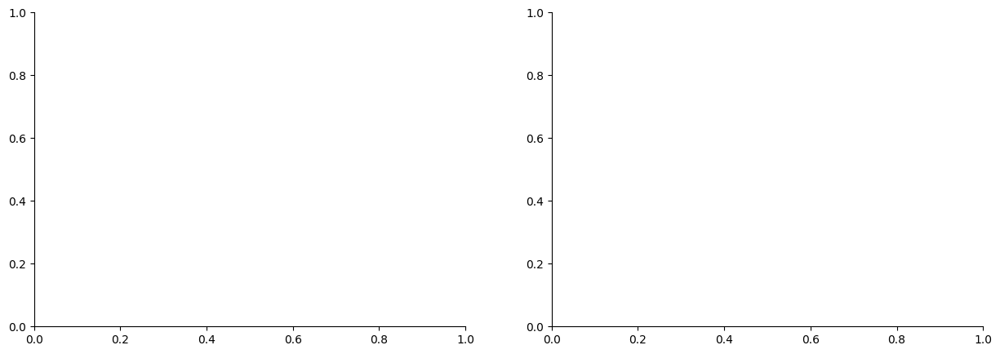

In [101]:
# GAN compration, sampling, score vs population size all in one plot

metric_name_list = ["MSE", "cosine"]
coulumn_of_intrest = "score"# "l2_distance_normalized" # "sim_index_l2", "sim_index_l1", "l2_distance"

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25

line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")
panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_score")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        fig, ax = plt.subplots(1, 2, figsize=(15, 5))
        for i, metric_name in enumerate(metric_name_list):
            if sub_pop_type == "random":
            # do the mean and sem by negleting np.nan values
                mean_result_BG =  metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                    "pop_size")[coulumn_of_intrest].mean()
                
                std_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                    "pop_size")[coulumn_of_intrest].sem()
                
                mean_result_fc6 =  metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                    "pop_size")[coulumn_of_intrest].mean()
                
                std_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "pop_resampling_id"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                    "pop_size")[coulumn_of_intrest].sem()
            elif sub_pop_type == "most":
                mean_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                "pop_size")[coulumn_of_intrest].mean()
                std_result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                "pop_size")[coulumn_of_intrest].sem()
                mean_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                "pop_size")[coulumn_of_intrest].mean()
                std_result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                "trget_imge_name", "pop_size"])[coulumn_of_intrest].mean().reset_index().groupby(
                                                "pop_size")[coulumn_of_intrest].sem()
            mean_result_index_BG  = mean_result_BG.index
            mean_result_BG  = mean_result_BG.values
            std_result_BG = std_result_BG.values

            mean_result_index_fc6  = mean_result_fc6.index
            mean_result_fc6  = mean_result_fc6.values
            std_result_fc6 = std_result_fc6.values

            if metric_name == "cosine":
                mean_result_index_BG = mean_result_index_BG[1:]
                mean_result_BG = mean_result_BG[1:]
                std_result_BG = std_result_BG[1:]

                mean_result_index_fc6 = mean_result_index_fc6[1:]
                mean_result_fc6 = mean_result_fc6[1:]
                std_result_fc6 = std_result_fc6[1:]

            # plot the results using subplots and erorbar and conected dot and log 2 scale for the x axis and make the coloe of bars similar to the color of the line
            ax[i].plot(mean_result_index_BG, mean_result_BG, '--', color='r', label="bigBAN", linewidth=3)
            ax[i].fill_between(mean_result_index_BG, mean_result_BG-std_result_BG, mean_result_BG+std_result_BG,
                                color='r', alpha=0.4, label='')
            ax[i].plot(mean_result_index_fc6, mean_result_fc6, '--', color='g', label="fc6", linewidth=3)
            ax[i].fill_between(mean_result_index_fc6, mean_result_fc6-std_result_fc6, mean_result_fc6+std_result_fc6,
                                color='g', alpha=0.4, label='')
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)

            ax[i].set_xscale('log', base=2)

            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')

        # get y lims for all the subplots
        y_lims = [ax[i].get_ylim() for i in range(len(ax))]
        # define the y lim that cincludes all the subplots y lims
        y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]
        
    
        ax[0].set_ylabel(f"Objective Score \n", fontsize=axis_font_size)
        ax[1].set_xlabel("Population size", fontsize=32)    
        # add legend to as layers names to the second subplot outside the plot        
        ax[1].legend( loc='upper right', bbox_to_anchor=(1.8, 1), fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_xlim([2**0-.3, 2**10])
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
        # set title for the whole figure
        fig.suptitle(f"{sub_pop_type}-{layer_short}", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        plt.savefig(os.path.join(save_path, f"{sub_pop_type}_{layer_short}_{coulumn_of_intrest}_vx_pop_size.png"), bbox_inches="tight", pad_inches=0)
        plt.show()



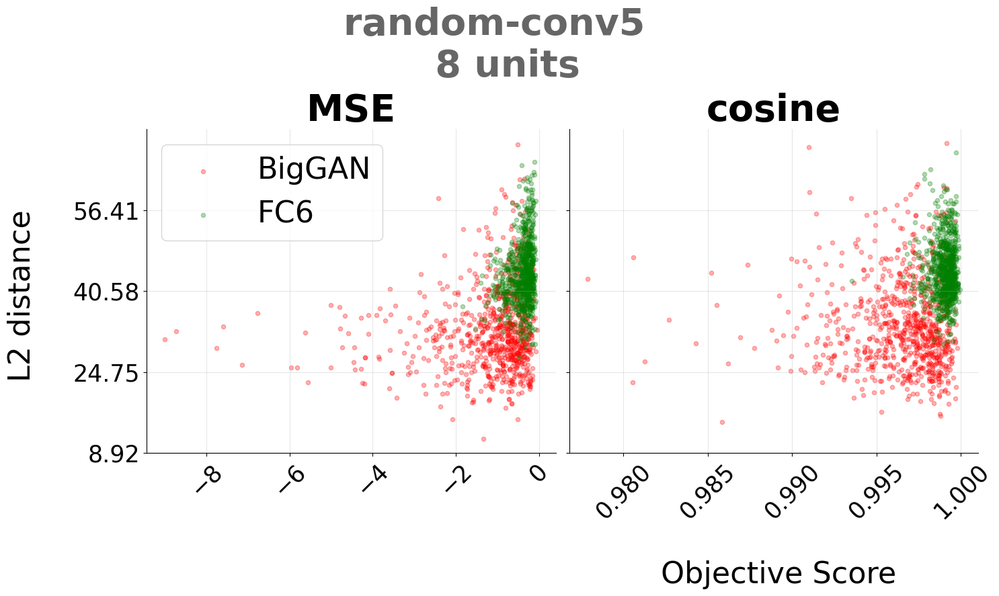

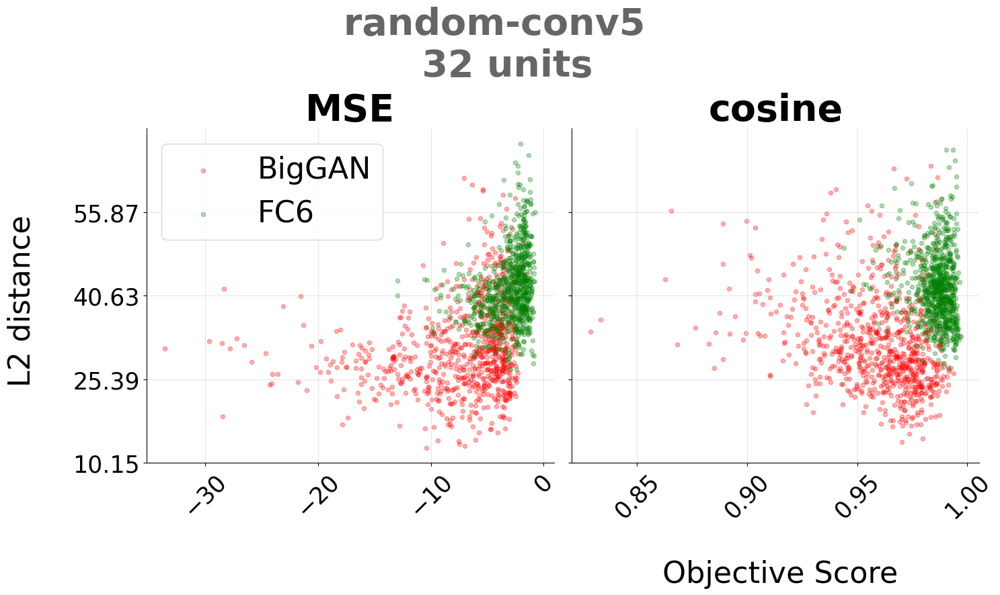

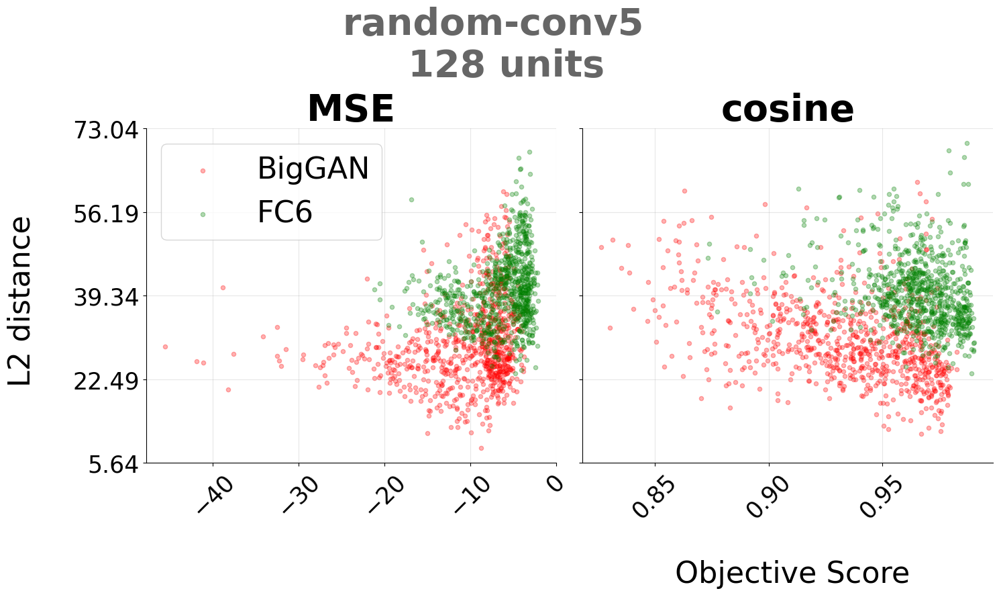

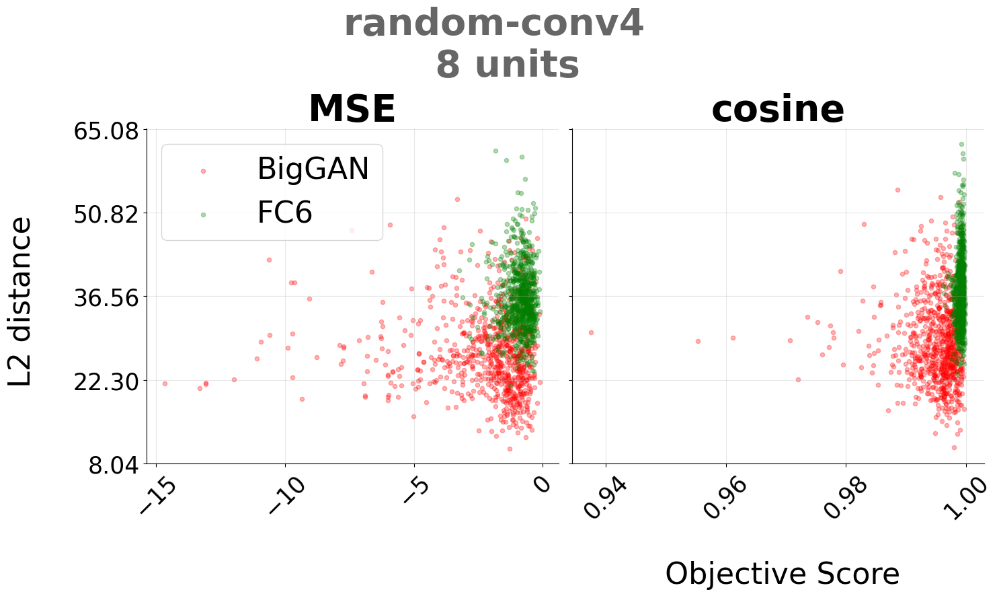

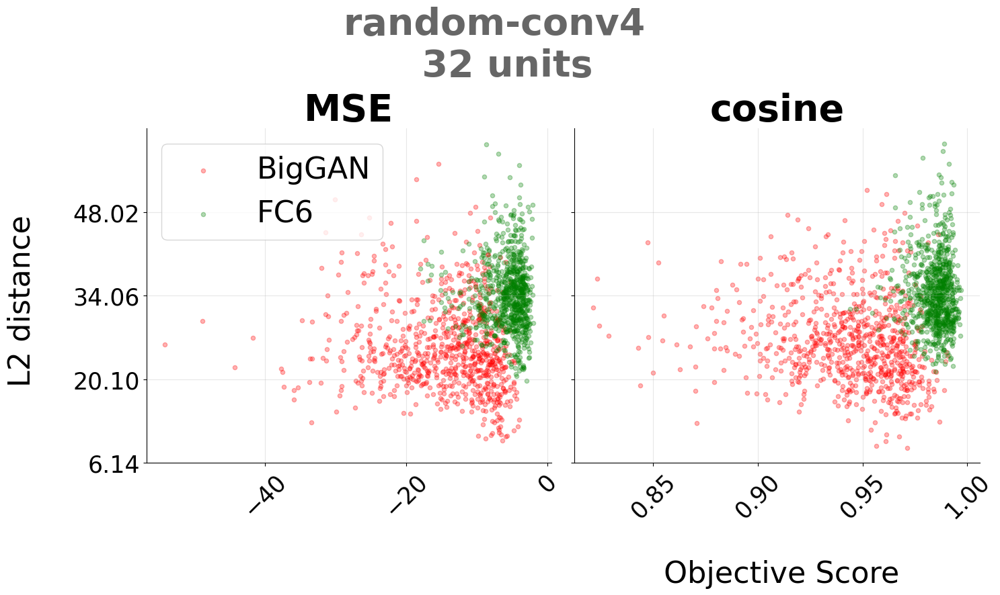

...

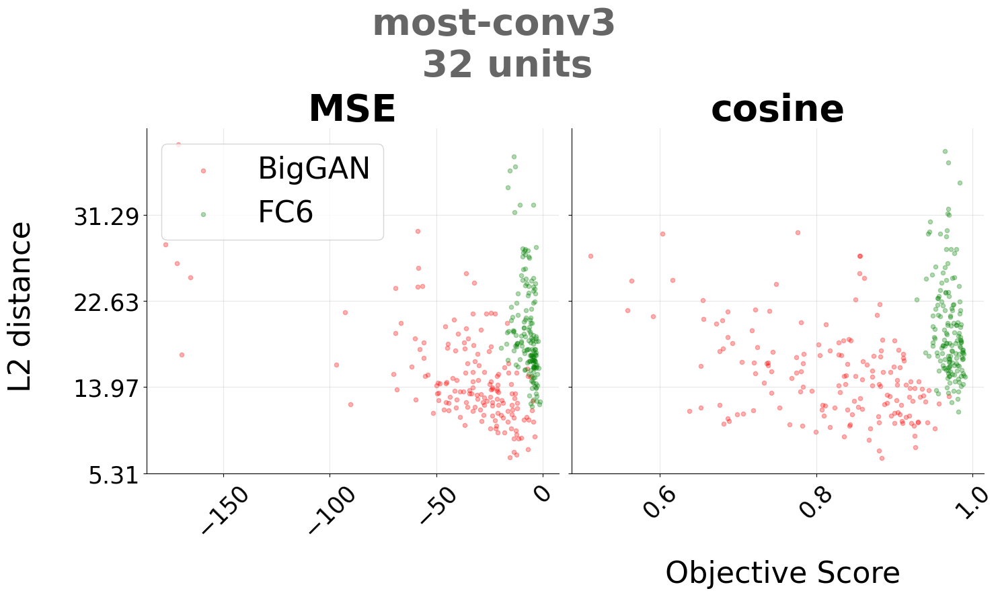

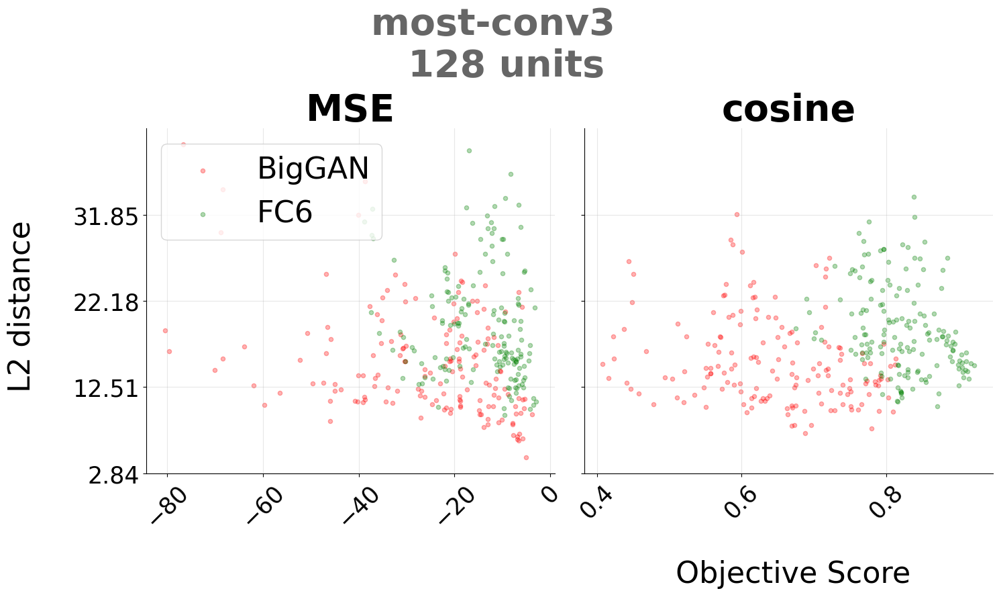

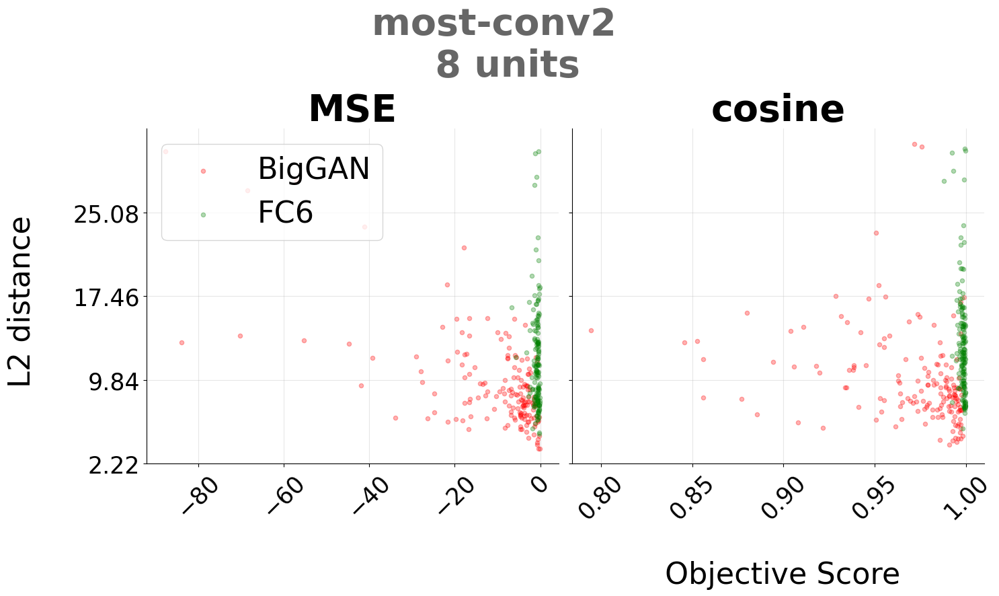

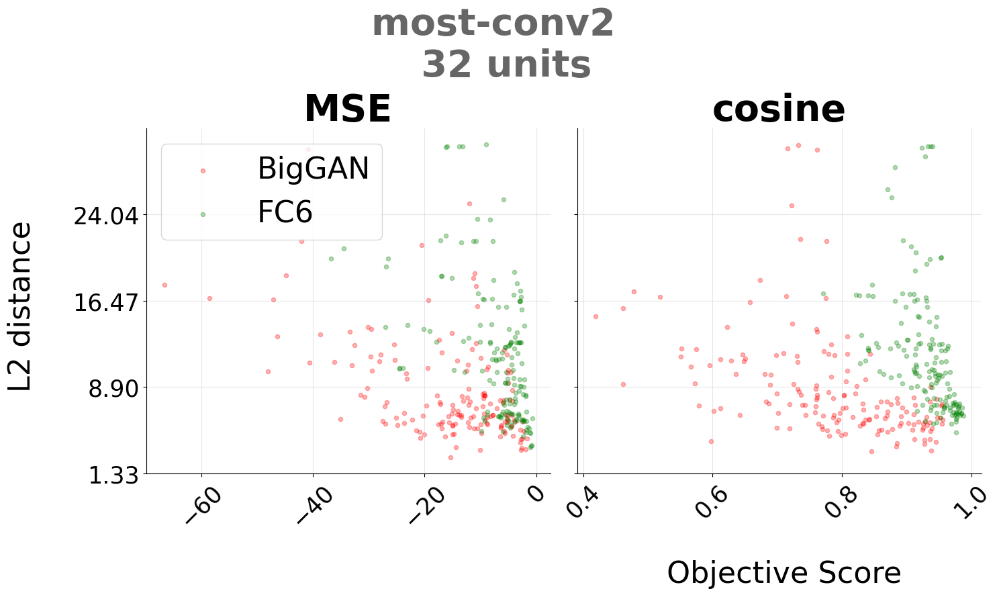

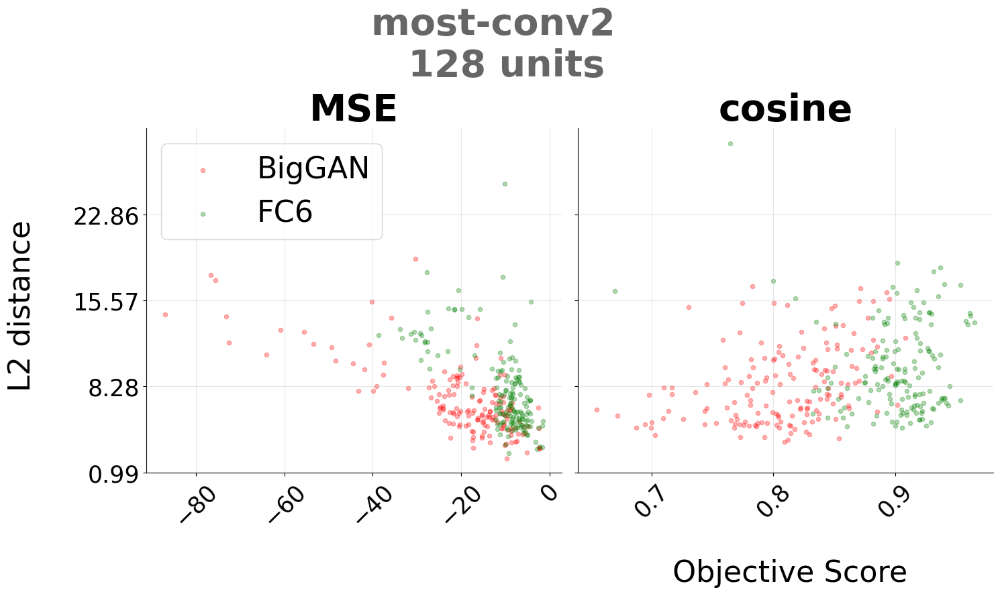

In [113]:
# GAN compratiom. score vs similarity for bigGAN and FC6
metric_name_list = ["MSE", "cosine"]
coulumn_of_intrest_set = ["score", "l2_distance"] # "l2_distance_normalized" # "sim_index_l2", "sim_index_l1", "l2_distance"
layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25
gan_df_list = [metadata_df_cosine_BG, metadata_df_cosine_fc6]
gan_name_list = ["BigGAN", "FC6"]
gan_name_color_dict = {"BigGAN":'r', "FC6":'g'}
pop_size_list = [8,32, 128]

panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_scater_scoreVsL2")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        for pop_size in pop_size_list:
            fig, ax = plt.subplots(1, 2, figsize=(15, 9))
            for i, metric_name in enumerate(metric_name_list):
                for gan_i in range(len(gan_df_list)):
                    metadata_df = gan_df_list[gan_i]
                    col_val_list = list()
                    for coulumn_of_intrest in coulumn_of_intrest_set:
                        col_df =  metadata_df[(metadata_df["output_type"] == "best_gen_imgs_RF_masked") & \
                                            (metadata_df["similarity_metric"]==metric_name) & (
                                            metadata_df["layer_short"]==layer_short) & (
                                            metadata_df["sub_pop_type"] == sub_pop_type) & (
                                            metadata_df["pop_size"] == pop_size)]
                        if metric_name == "cosine":
                            col_df = col_df[col_df["pop_size"] != 1]

                        col_val_list.append(col_df[coulumn_of_intrest])
                        colors_set = np.zeros((len(col_df), 3))
                        colors_set[:] = .5
                    # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
                    ax[i].scatter(col_val_list[0], col_val_list[1], alpha=0.3, s=20, label=gan_name_list[gan_i], color=gan_name_color_dict[gan_name_list[gan_i]])
                ## add grid
                ax[i].grid(True, which='both', axis='both', alpha=0.3)
                ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')

                # get the y lims for all the subplots
                y_lims = [ax[i].get_ylim() for i in range(len(ax))]
                # define the y lim that cincludes all the subplots y lims
                y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]

                # get the x lims for all the subplots
                x_lims = [ax[i].get_xlim() for i in range(len(ax))]
                # define the x lim that cincludes all the subplots y lims
                x_lim = [min([x_lims[i][0] for i in range(len(ax))]), max([x_lims[i][1] for i in range(len(ax))])]
            
        
            ax[0].set_ylabel(f"L2 distance \n", fontsize=axis_font_size)
            ax[1].set_xlabel(f"\n Objective Score", fontsize=axis_font_size)
            # set the y lim for all the subplots
            for i in range(len(ax)):
                
                # set the y and x lim for all the subplots
                ax[i].set_ylim(y_lim)
                # make Y-tiks nicer and round them to 1 decimal
                ax[i].set_yticks(np.arange(min(y_lim), max(y_lim), round((max(y_lim)-min(y_lim))/4, 2)))
                # increase the font size of the y  and x ticks
                ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
                ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
                # rotate the x ticks labels
                ax[i].tick_params(axis='x', rotation=45)
            # remove the y ticks labels from the second subplot
            ax[1].set_yticklabels([])
            # add legend
            ax[0].legend(fontsize=axis_font_size, loc='upper left')
            # set title for the whole figure
            fig.suptitle(f"{sub_pop_type}-{layer_short} \n {pop_size} units", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
            # set tight layout
            fig.tight_layout()
            plt.savefig(os.path.join(save_path, f"{sub_pop_type}_{pop_size}_{layer_short}_scoreVSsimilarity_vx_pop_size.png"), bbox_inches="tight", pad_inches=0)
            plt.show()

In [238]:
# test merg opration
metric_name_list = ["MSE", "cosine"]

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25

line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")
pop_size_list = [8,32, 128]

sub_pop_type = "random"
layer_short = "conv2"
pop_size = 128
metric_name = "cosine"
metadata_df_1 = metadata_df_cosine_BG;           
metadata_df_1_sub =  metadata_df_1[(metadata_df_1["output_type"] == "best_gen_imgs_RF_masked") & \
                    (metadata_df_1["similarity_metric"]==metric_name) & (
                    metadata_df_1["layer_short"]==layer_short) & (
                    metadata_df_1["sub_pop_type"] == sub_pop_type) & (
                    metadata_df_1["pop_size"] == pop_size)].loc[:,["output_type", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance", "pop_unit_idx"]]
metric_name = "MSE"        
metadata_df_2 = metadata_df_cosine_fc6;     
metadata_df_2_sub =  metadata_df_2[(metadata_df_2["output_type"] == "best_gen_imgs_RF_masked") & \
                    (metadata_df_2["similarity_metric"]==metric_name) & (
                    metadata_df_2["layer_short"]==layer_short) & (
                    metadata_df_2["sub_pop_type"] == sub_pop_type) & (
                    metadata_df_2["pop_size"] == pop_size)].loc[:,["output_type", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance", "pop_unit_idx"]]

outer_merged = pd.merge(metadata_df_1_sub, metadata_df_2_sub, on=['output_type', 'trget_imge_name', 'pop_resampling_id', 'gen_rerun_id'], how='outer', indicator=True)
outer_merged['unit_id_diff'] = outer_merged.apply(lambda df_row: (df_row['pop_unit_idx_x']['.features.Conv2d3'] - df_row['pop_unit_idx_y']).sum(), axis=1)
outer_merged['unit_id_diff'].sum()

0

for delta score = 0.2028578519821167: the color is [0.9992197  0.83100723 0.6764127 ]


C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\3992623501.py:4: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(x=1, y=1, s=3000, c=color_mat[i], alpha=0.5, edgecolors='none')


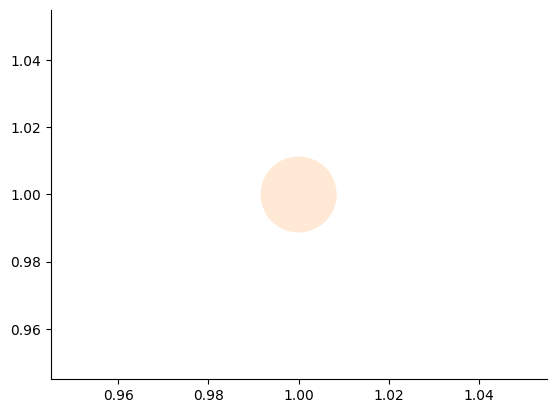

In [332]:
# test color map
color_mat = zero_centered_color_map(score_colors, delta_score, delta_score.min(), delta_score.max())
i = np.argmax(delta_score)
print(f"for delta score = {delta_score[i]}: the color is {color_mat[i]}")
plt.scatter(x=1, y=1, s=3000, c=color_mat[i], alpha=0.5, edgecolors='none')
plt.show()

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


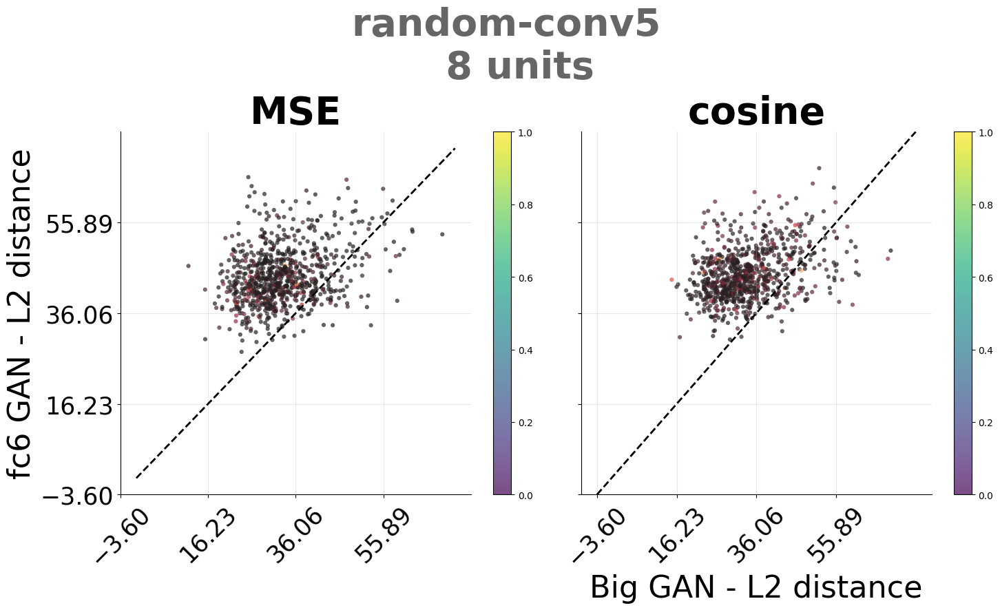

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


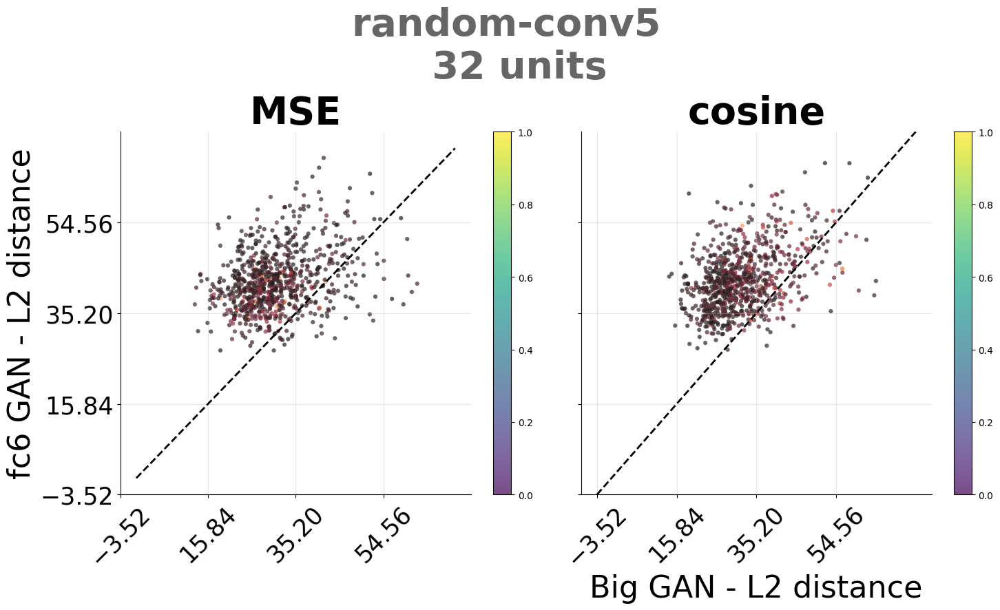

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


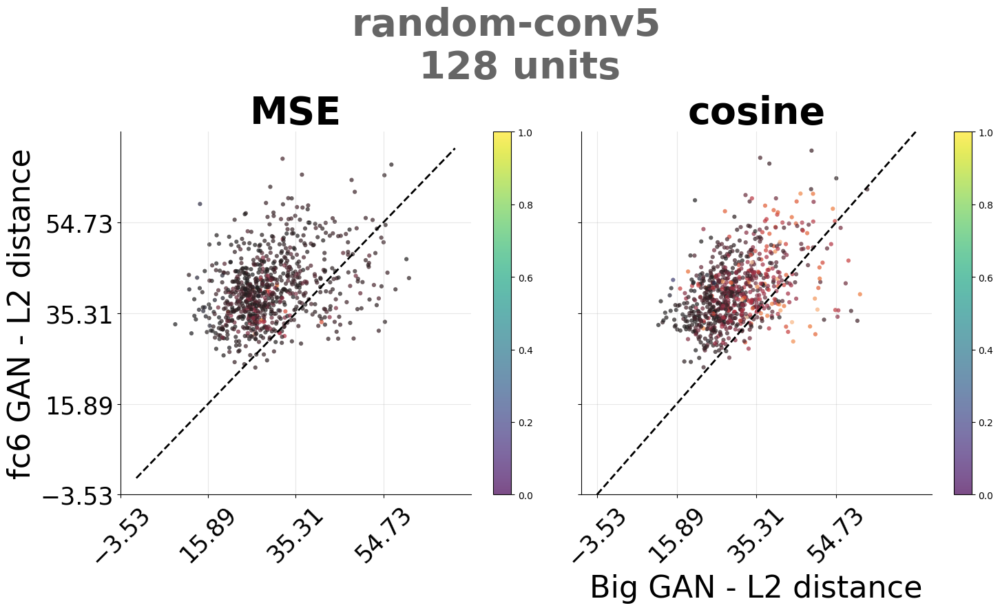

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


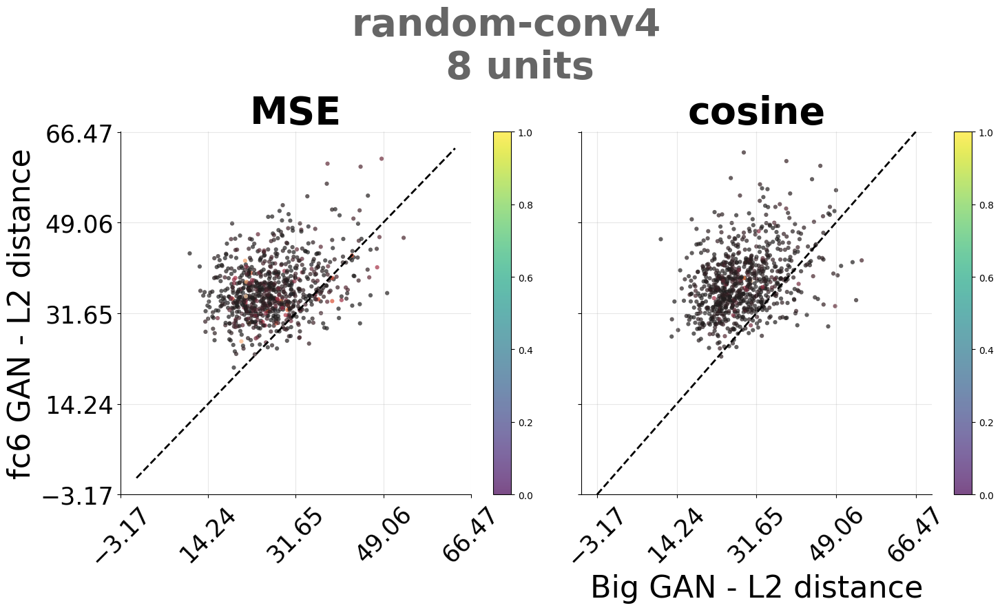

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


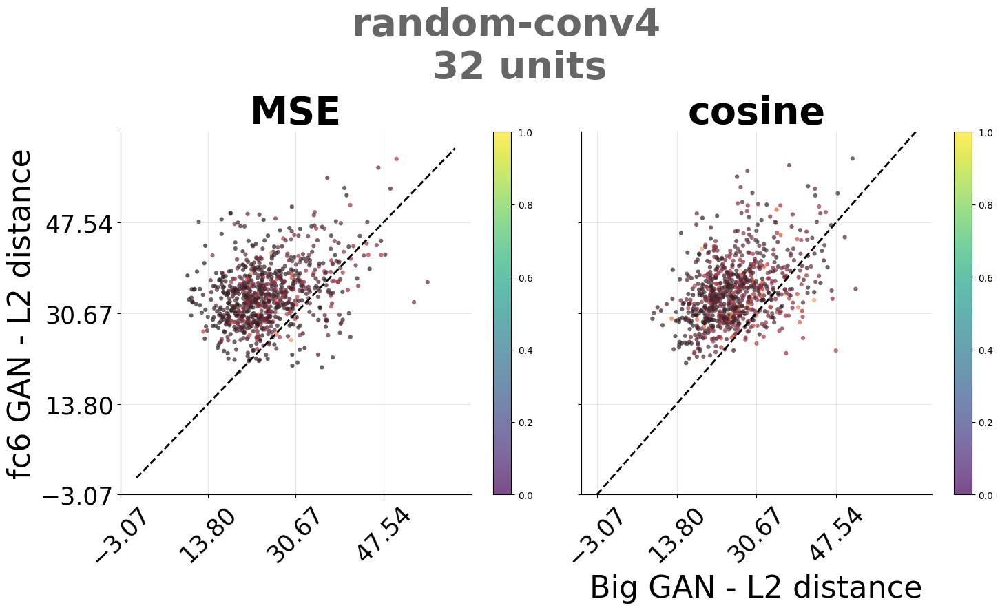

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


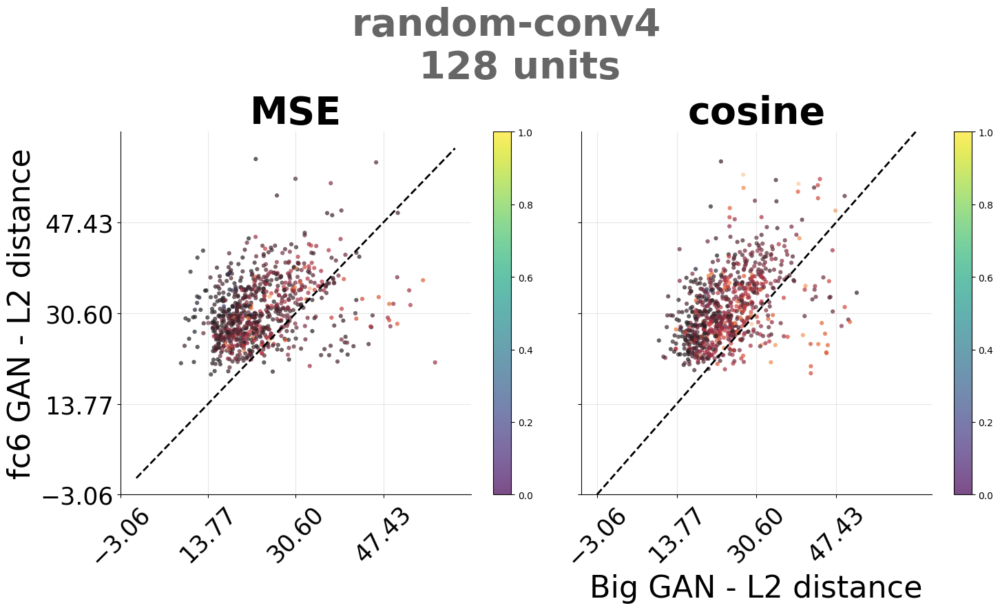

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


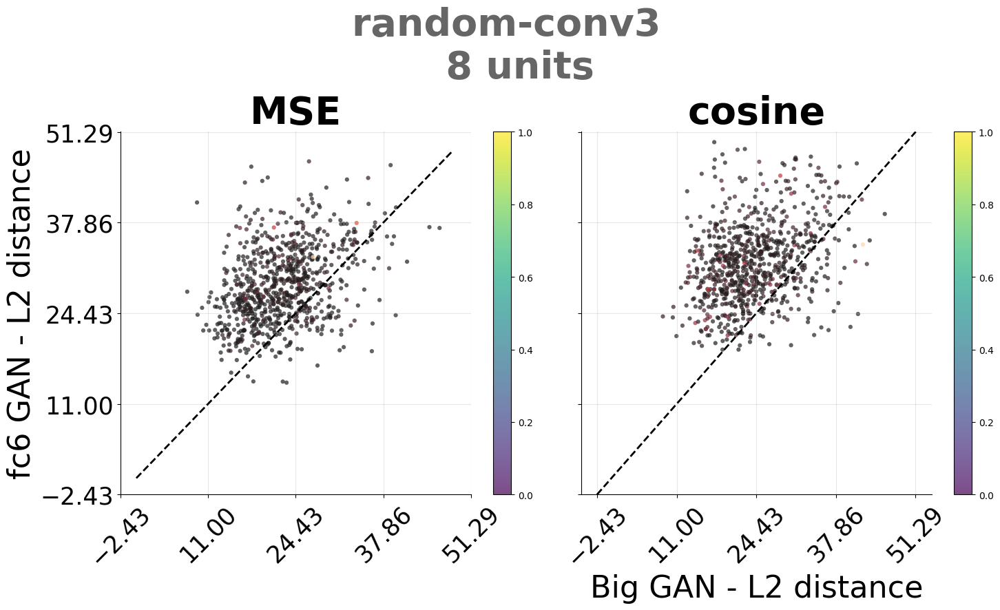

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


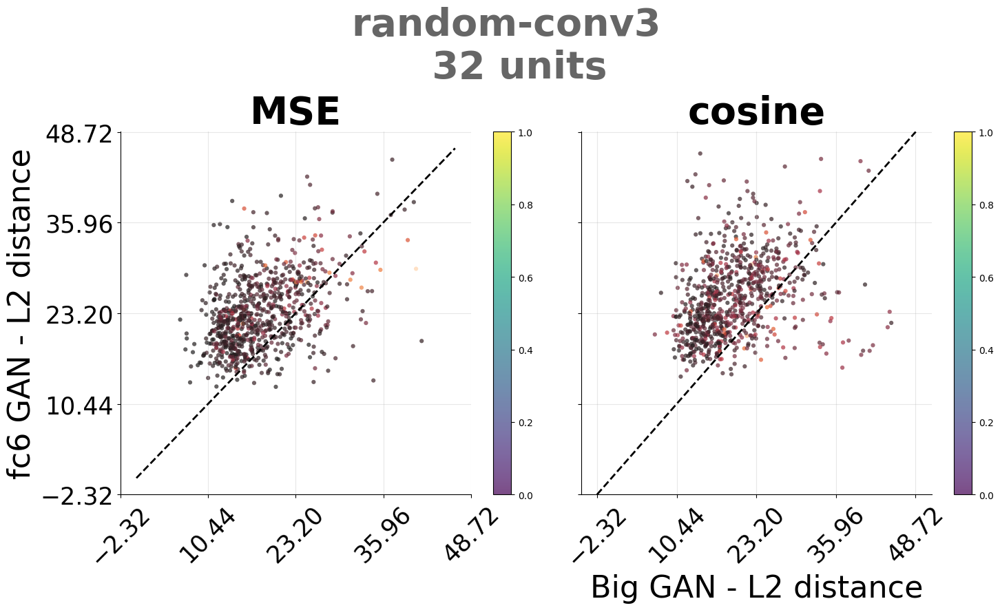

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


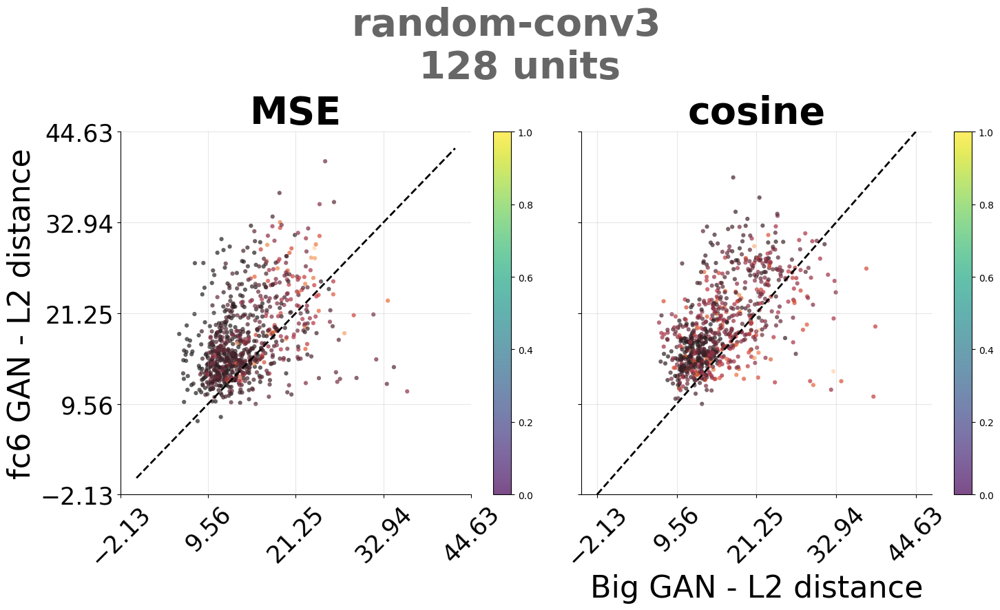

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


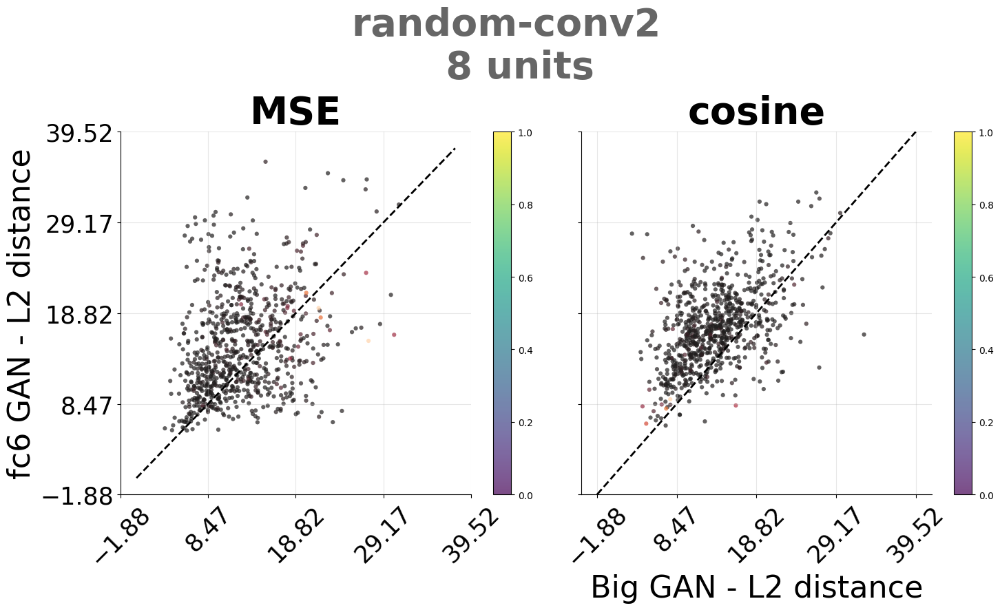

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


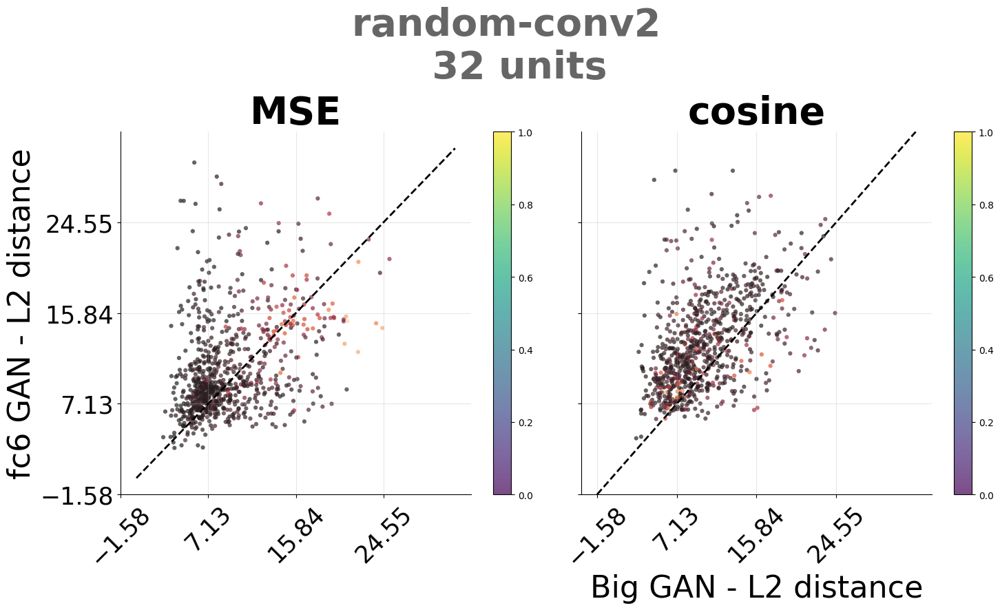

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


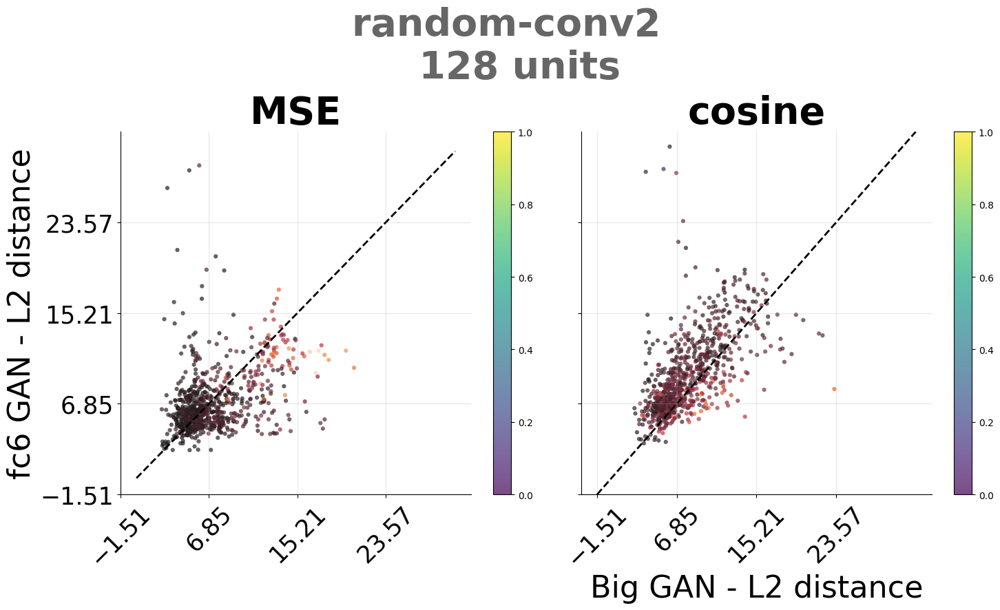

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


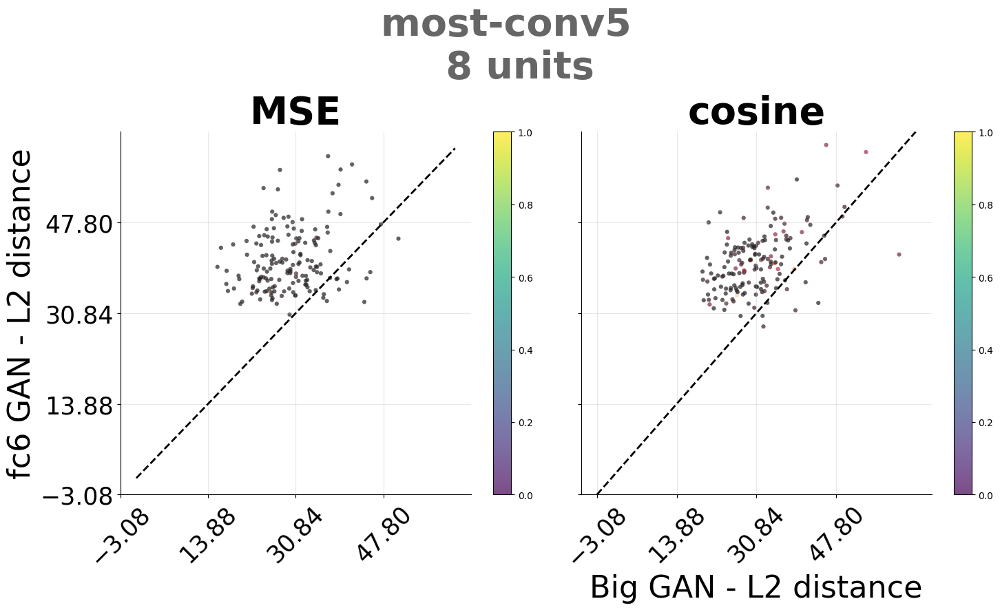

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


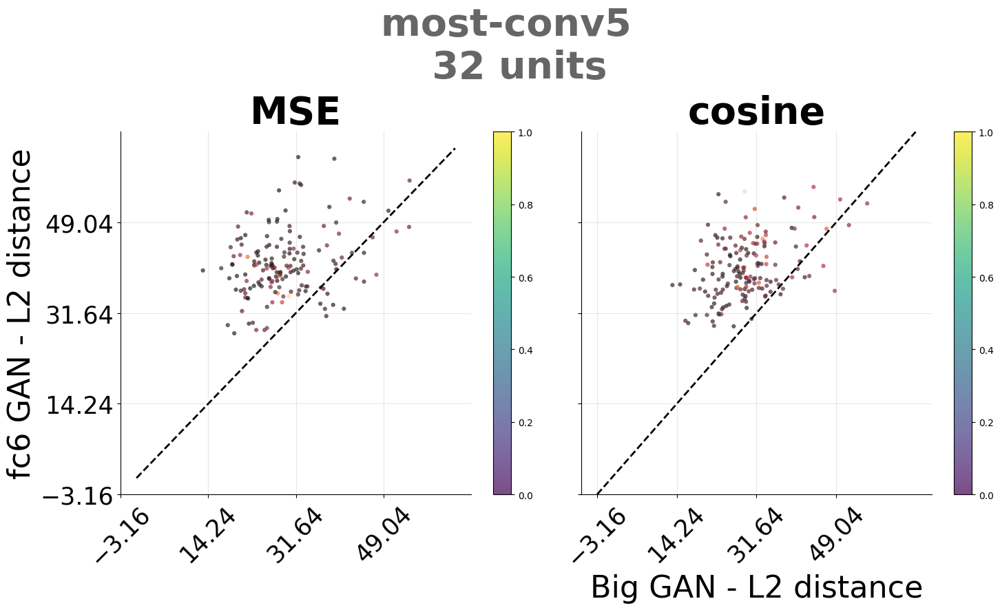

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


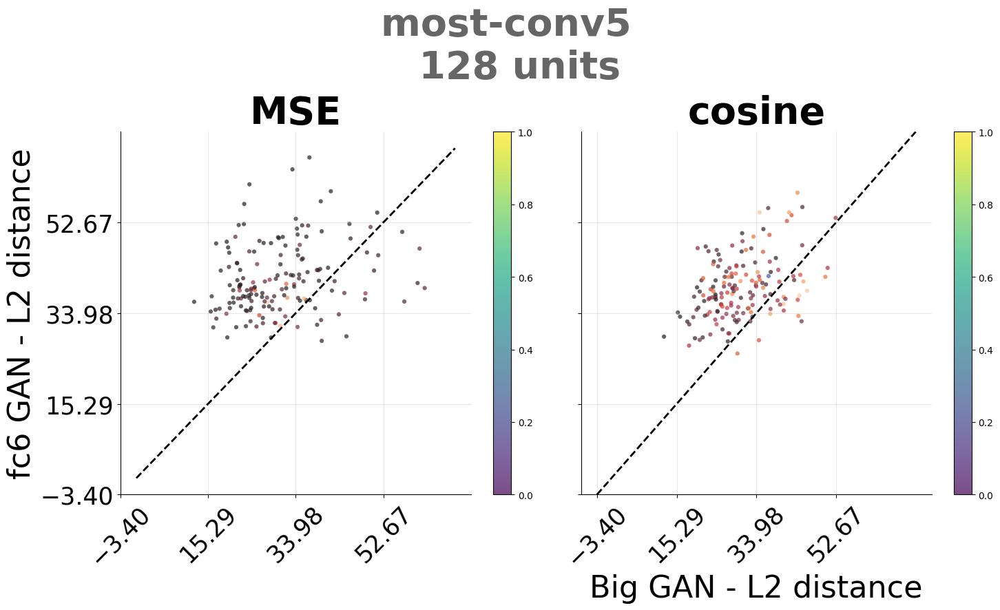

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


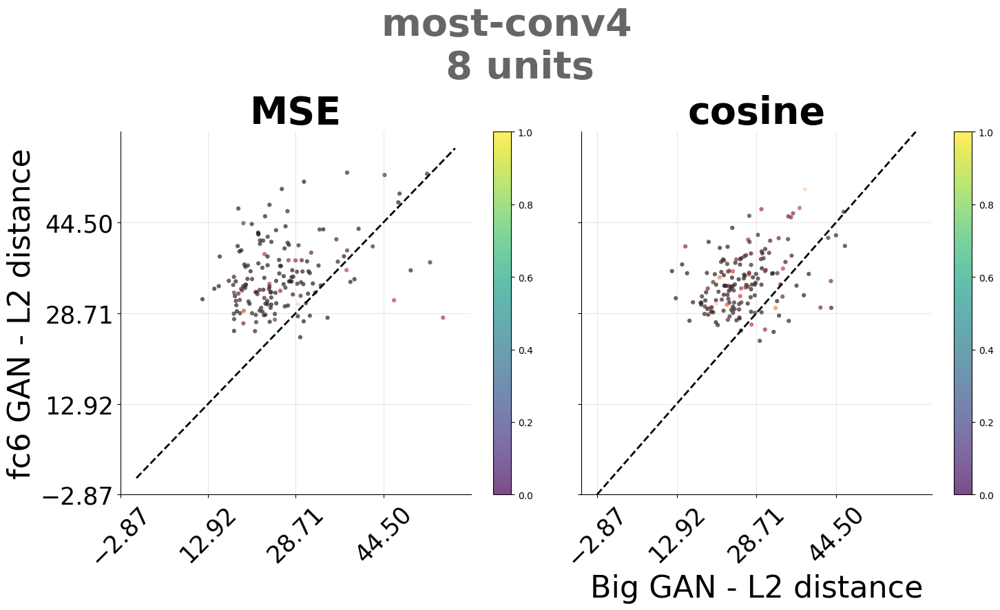

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


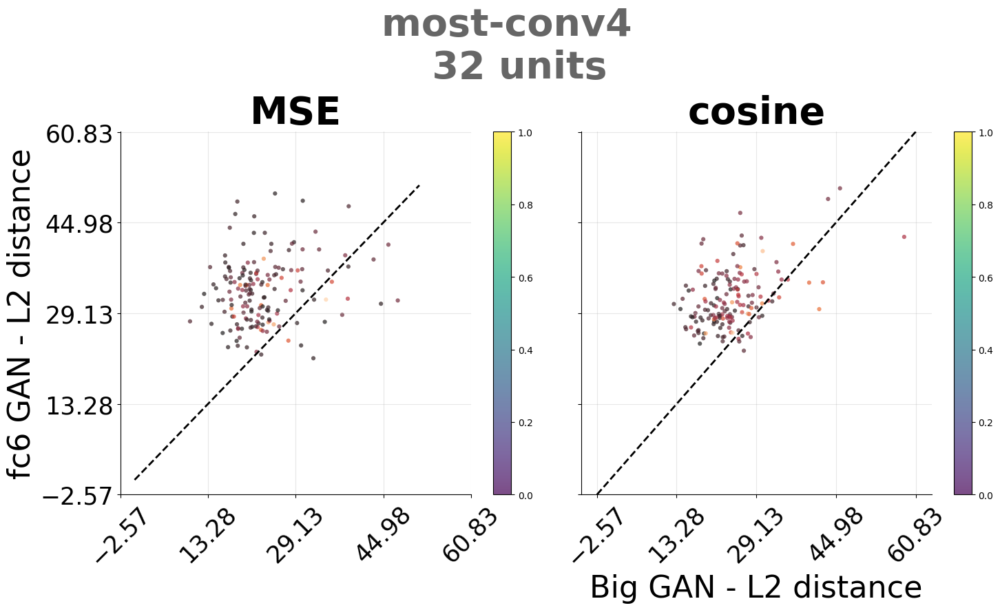

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


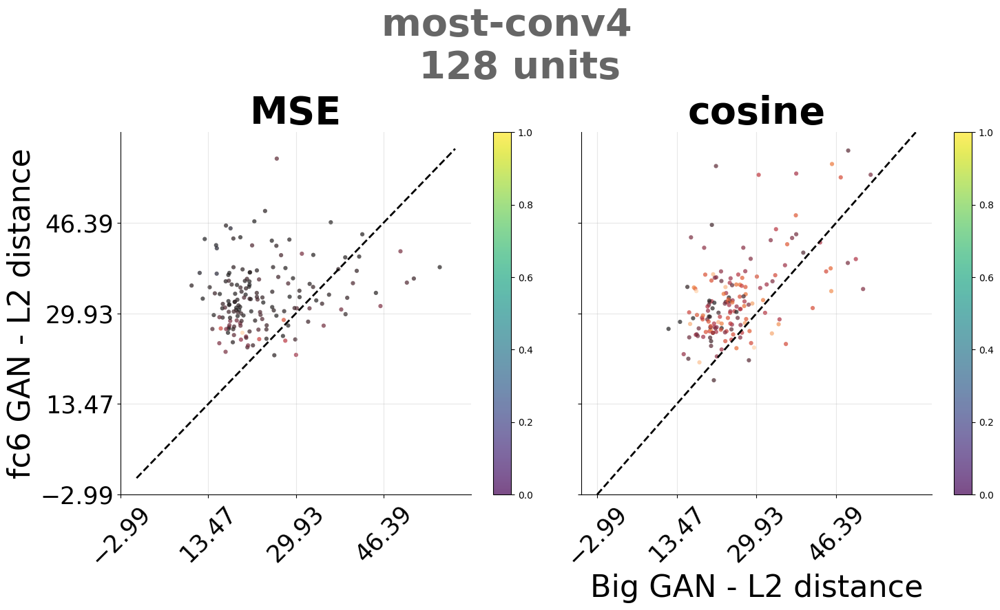

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


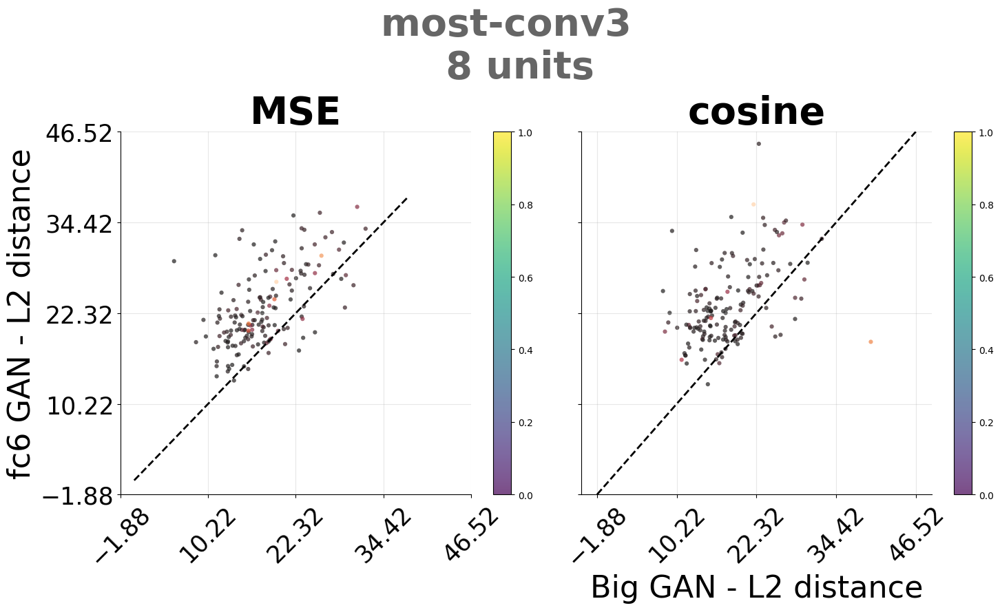

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


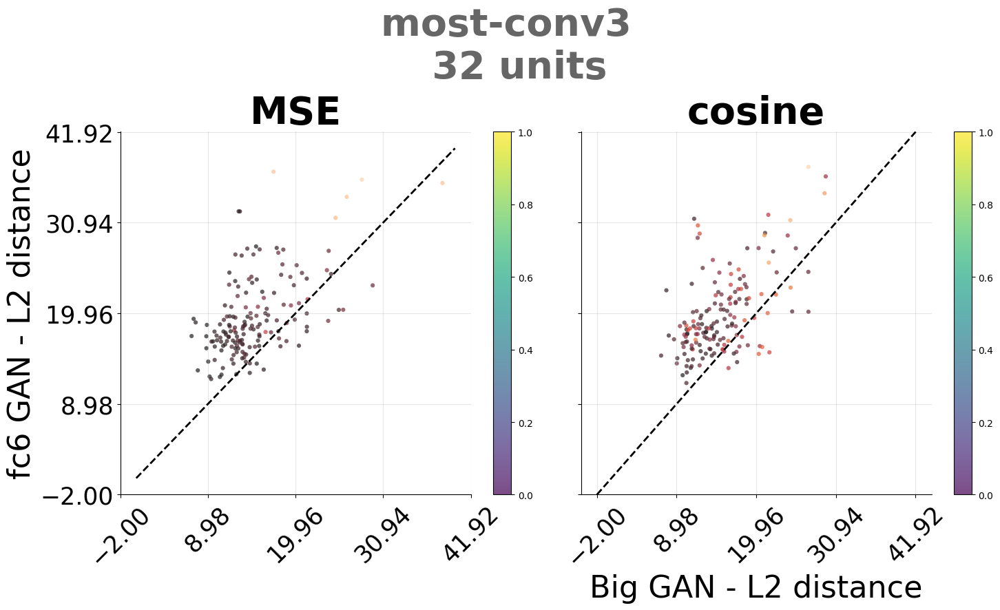

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


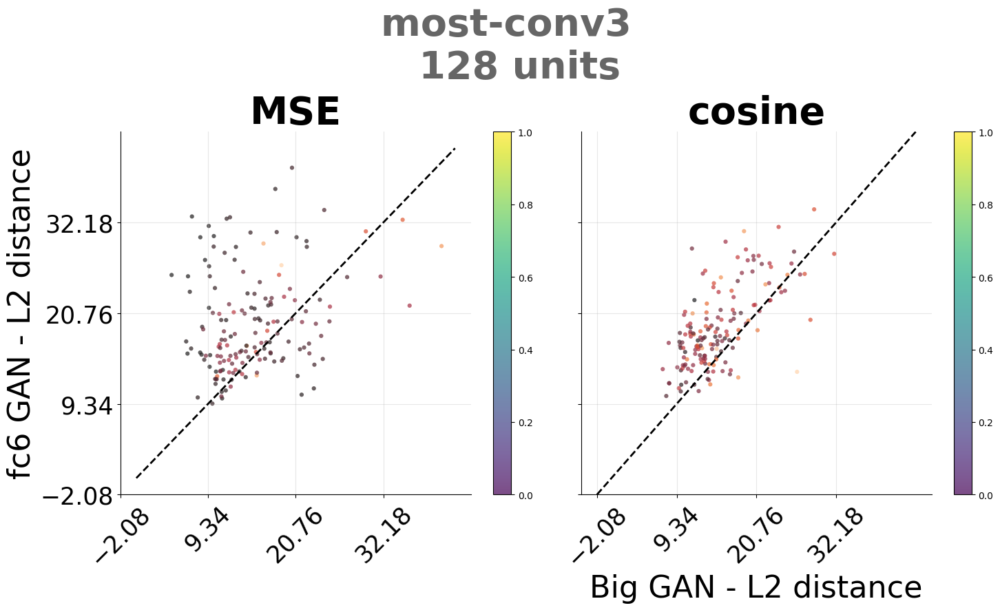

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


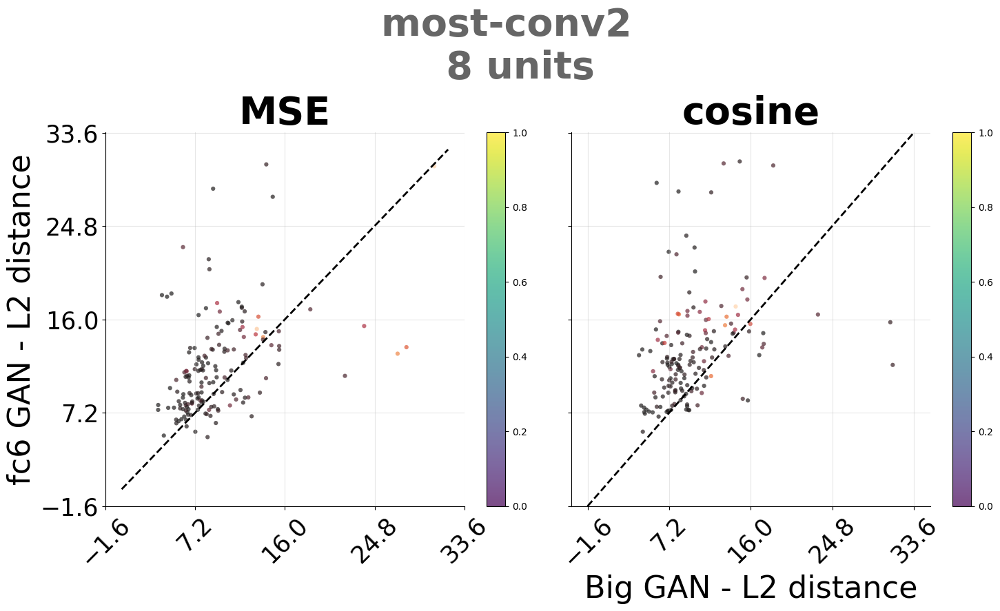

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


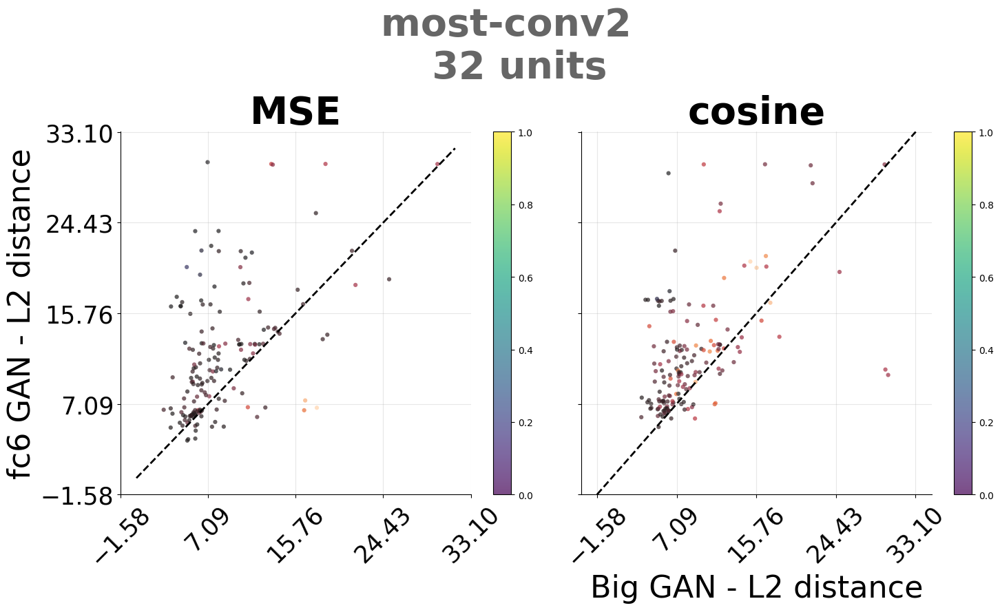

C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
C:\Users\Alireza\AppData\Local\Temp\ipykernel_18688\30720696.py:72: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\


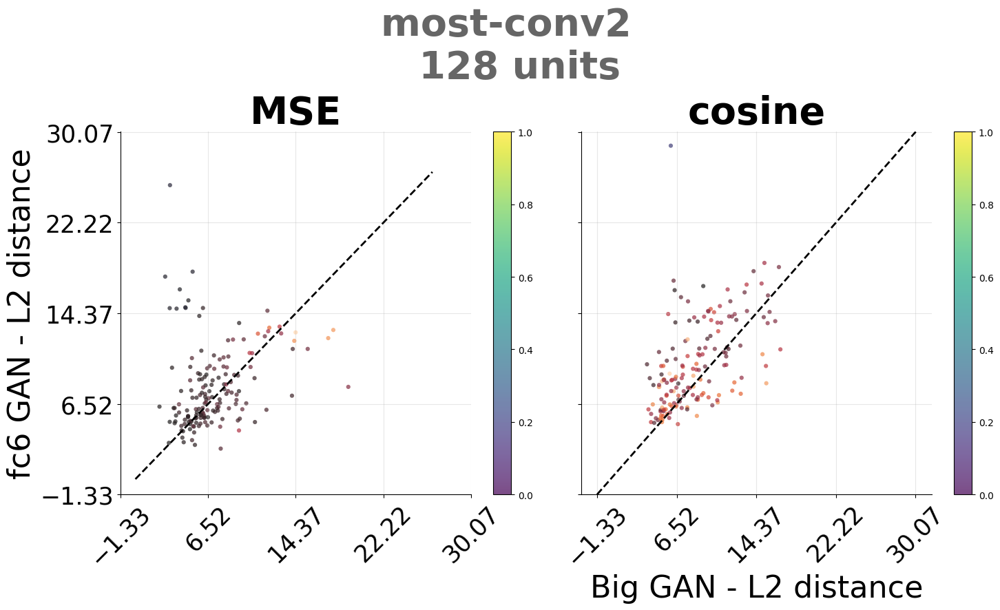

In [312]:
# GAN compratiom. similarity of Fc6 vs bigGAN 
import seaborn as sns

metric_name_list = ["MSE", "cosine"]
layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25
gan_df_list = [metadata_df_cosine_BG, metadata_df_cosine_fc6]
gan_name_list = ["BigGAN", "FC6"]
gan_name_color_dict = {"BigGAN":'r', "FC6":'g'}
line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")
pop_size_list = [8,32, 128]

score_cmp = sns.color_palette("icefire", as_cmap=True)
score_colors = score_cmp.colors

def zero_centered_color_map(cmp_clors, v_vec, vmin, vmax):
    # cmp_clors: a N * 3 matrix, each row is a color
    # v_vec: a vector of values
    # vmin: the min value of the color bar should be lower or equal to 0
    # vmax: the max value of the color bar
    if vmin > 0:
        vmin = 0
    if abs(vmax) > abs(vmin):
        vmin = -vmax
    elif abs(vmax) < abs(vmin):
        vmax = -vmin
    # get the length of the color map
    N = len(cmp_clors)
    # get the length of the v_vec
    M = len(v_vec)
    # make a matrix of the colors with the same size as the v_vec
    # find index in the color map for each value in the v_vec in a way that zero is in the middle of the color map
    color_idx = np.round((v_vec-vmin)/(vmax-vmin)*(N-1)).astype(int)
    # make a matrix of the colors with the same size as the v_vec
    color_mat = np.zeros((M, 3))
    # fill the color matrix with the colors from the color map
    for i in range(M):
        color_mat[i, :] = cmp_clors[color_idx[i]]
    return color_mat
    
        

panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_similarities")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        for pop_size in pop_size_list:
            fig, ax = plt.subplots(1, 2, figsize=(15, 9))
            for i, metric_name in enumerate(metric_name_list):
                metadata_df_1 = metadata_df_cosine_BG;           
                metadata_df_1_sub =  metadata_df_1[(metadata_df_1["output_type"] == "best_gen_imgs_RF_masked") & \
                                    (metadata_df_1["similarity_metric"]==metric_name) & (
                                    metadata_df_1["layer_short"]==layer_short) & (
                                    metadata_df_1["sub_pop_type"] == sub_pop_type) & (
                                    metadata_df_1["pop_size"] == pop_size)].loc[:,["output_type", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance", "score"]]
                metadata_df_2 = metadata_df_cosine_fc6;     
                metadata_df_2_sub =  metadata_df_2[(metadata_df_2["output_type"] == "best_gen_imgs_RF_masked") & \
                                    (metadata_df_2["similarity_metric"]==metric_name) & (
                                    metadata_df_2["layer_short"]==layer_short) & (
                                    metadata_df_2["sub_pop_type"] == sub_pop_type) & (
                                    metadata_df_2["pop_size"] == pop_size)].loc[:,["output_type", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance", "score"]]

                outer_merged = pd.merge(metadata_df_1_sub, metadata_df_2_sub, on=['output_type', 'trget_imge_name', 'pop_resampling_id', 'gen_rerun_id'], how='outer', indicator=True)
                delta_score = outer_merged['score_y'] - outer_merged['score_x']
                # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
                sc = ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'],\
                        alpha=0.7, s=20, color= zero_centered_color_map(score_colors, delta_score, delta_score.min(), delta_score.max()),\
                        cmap=score_cmp, edgecolors='none')
                ## add grid
                ax[i].grid(True, which='both', axis='both', alpha=0.3)
                ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')
                

                # get the y lims for all the subplots
                y_lims = [ax[i].get_ylim() for i in range(len(ax))]
                # define the y lim that cincludes all the subplots y lims
                y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]

                # get the x lims for all the subplots
                x_lims = [ax[i].get_xlim() for i in range(len(ax))]
                # define the x lim that cincludes all the subplots y lims
                x_lim = [min([x_lims[i][0] for i in range(len(ax))]), max([x_lims[i][1] for i in range(len(ax))])]

                # set x and y axis range lim to be the same as the other rage of both
                ax_lim = [min(y_lim[0], x_lim[0]), max(y_lim[1], x_lim[1])]
                
                # plot the diagonal line
                ax[i].plot(ax_lim, ax_lim, color='k', linestyle='--', linewidth=2)
                # add the color bar to the plot
                # Create a color bar for the first subplot
                fig.colorbar(sc)
            
        
            ax[1].set_xlabel(f"Big GAN - L2 distance", fontsize=axis_font_size)
            ax[0].set_ylabel(f"fc6 GAN - L2 distance", fontsize=axis_font_size)
            # set the y lim for all the subplots
            for i in range(len(ax)):
                
                # set the y and x lim for all the subplots
                ax[i].set_ylim(ax_lim)
                ax[i].set_ylim(ax_lim)
                # make Y-tiks nicer and round them to 1 decimal
                ax[i].set_yticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
                ax[i].set_xticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
                # increase the font size of the y  and x ticks
                ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
                ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
                # rotate the x ticks labels
                ax[i].tick_params(axis='x', rotation=45)
            # remove the y ticks labels from the second subplot
            ax[1].set_yticklabels([])
            # set title for the whole figure
            fig.suptitle(f"{sub_pop_type}-{layer_short} \n {pop_size} units", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
            # set tight layout
            fig.tight_layout()
            plt.savefig(os.path.join(save_path, f"{sub_pop_type}_{pop_size}_{layer_short}_similarity_bigGAN_vs_fc6.png"), bbox_inches="tight", pad_inches=0)
            plt.show()

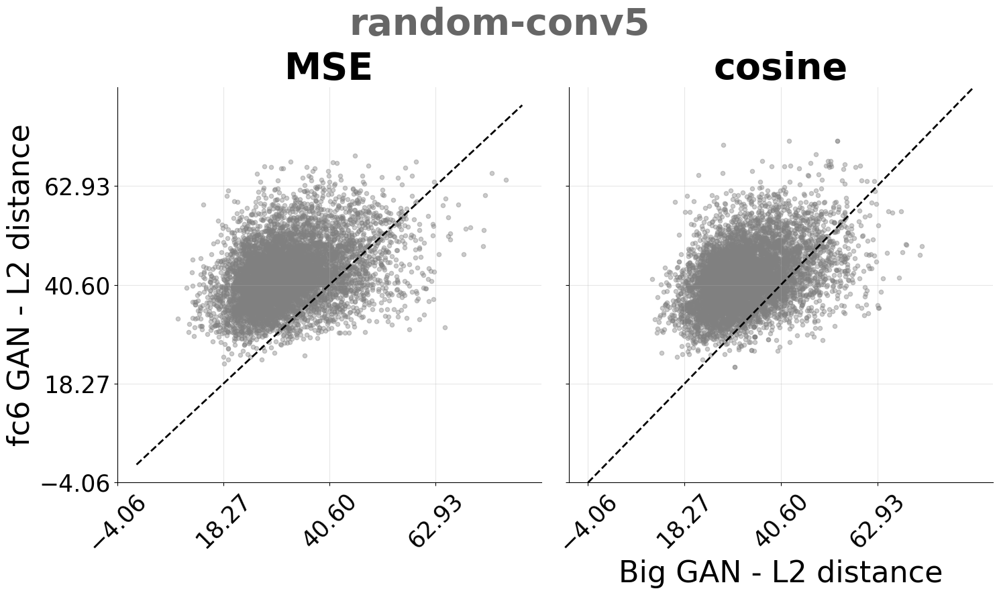

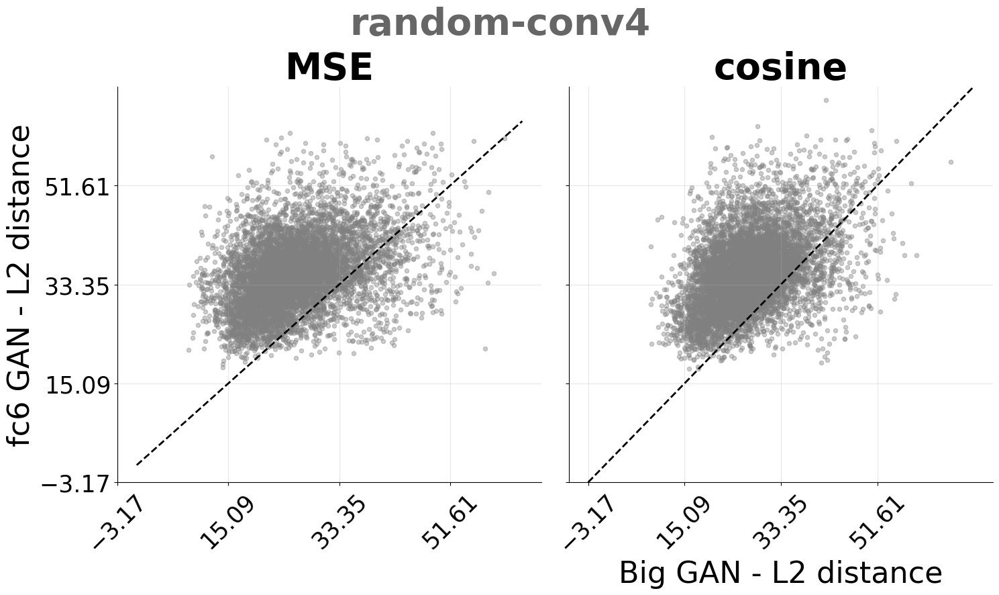

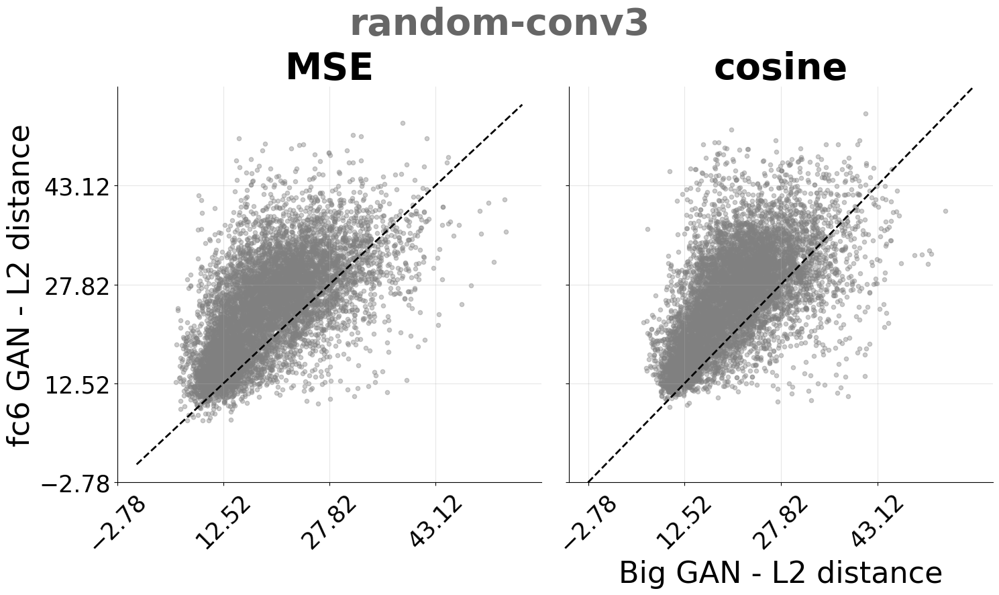

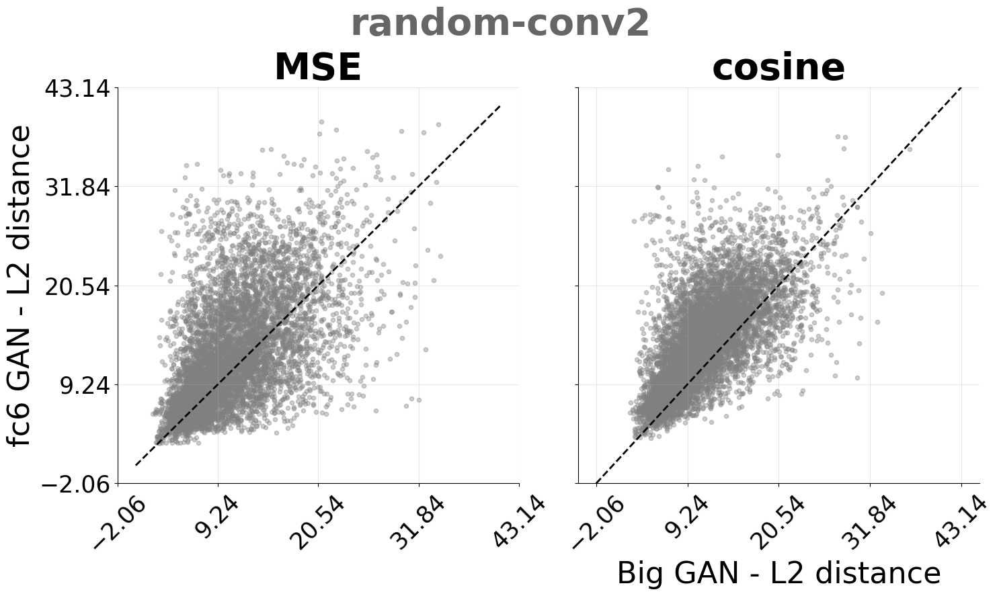

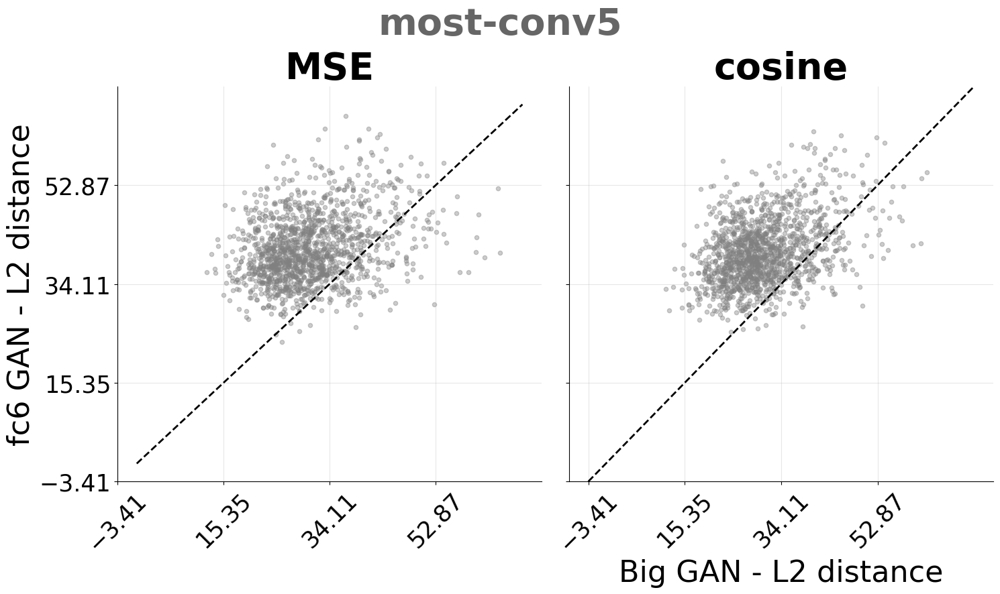

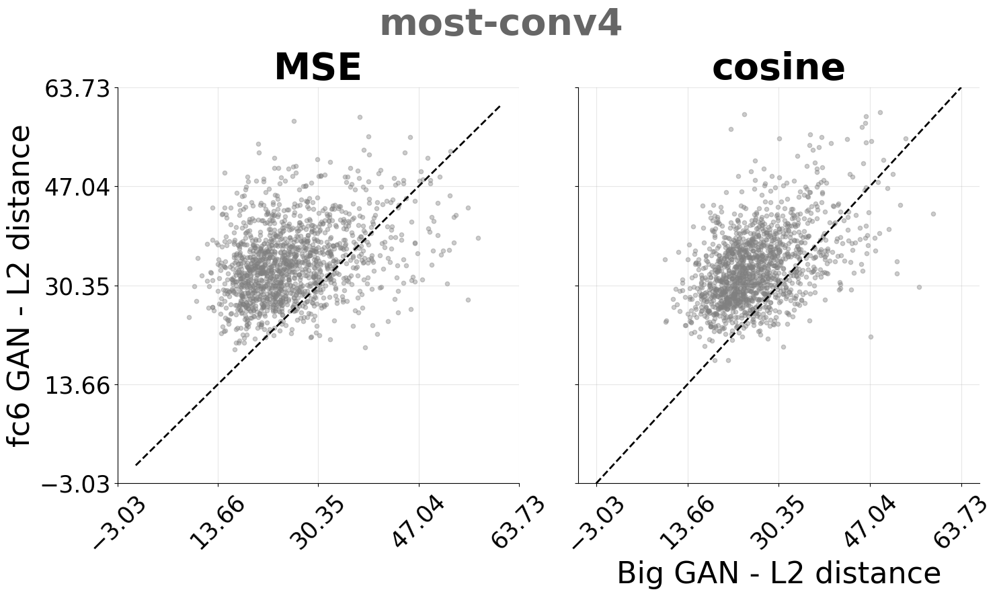

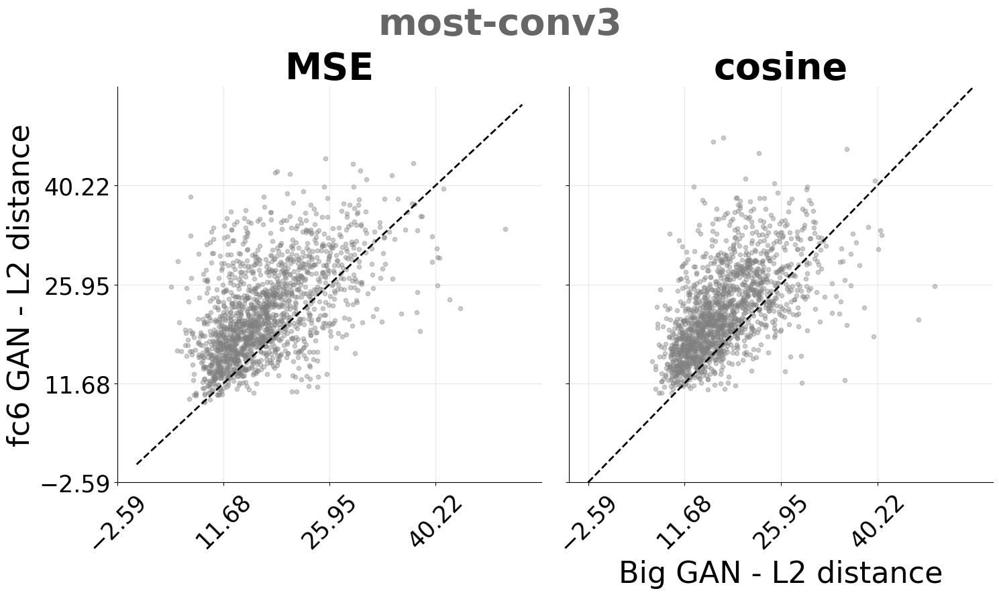

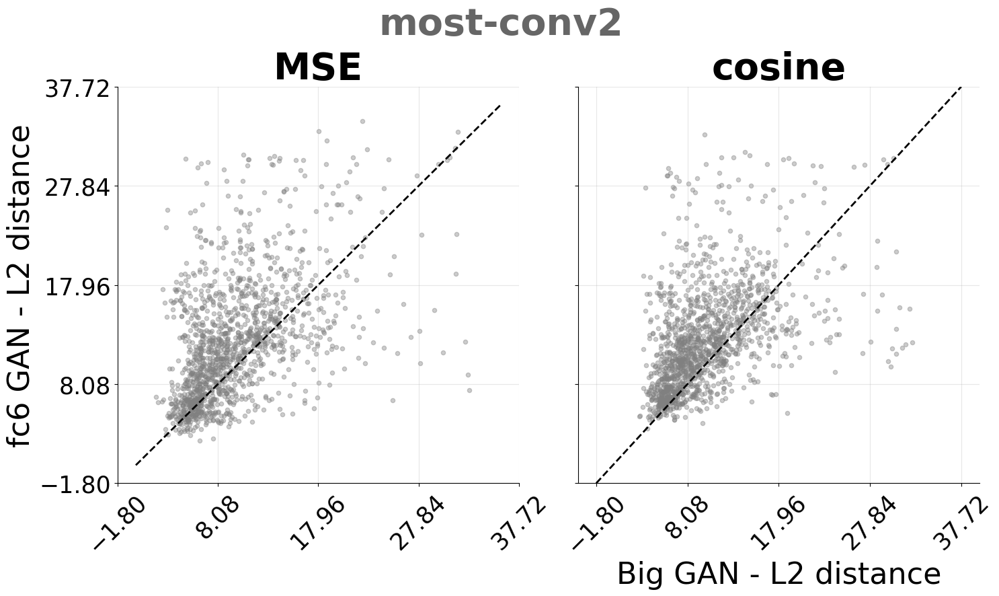

In [246]:
# GAN compratiom. similarity of Fc6 vs bigGAN - all pop size
metric_name_list = ["MSE", "cosine"]

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25
gan_df_list = [metadata_df_cosine_BG, metadata_df_cosine_fc6]
gan_name_list = ["BigGAN", "FC6"]
gan_name_color_dict = {"BigGAN":'r', "FC6":'g'}
line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")

panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_similarities")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        fig, ax = plt.subplots(1, 2, figsize=(15, 9))
        for i, metric_name in enumerate(metric_name_list):
            metadata_df_1 = metadata_df_cosine_BG;           
            metadata_df_1_sub =  metadata_df_1[(metadata_df_1["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df_1["similarity_metric"]==metric_name) & (
                                metadata_df_1["layer_short"]==layer_short) & (
                                metadata_df_1["sub_pop_type"] == sub_pop_type)].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance"]]
            metadata_df_2 = metadata_df_cosine_fc6;     
            metadata_df_2_sub =  metadata_df_2[(metadata_df_2["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df_2["similarity_metric"]==metric_name) & (
                                metadata_df_2["layer_short"]==layer_short) & (
                                metadata_df_2["sub_pop_type"] == sub_pop_type)].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance"]]

            outer_merged = pd.merge(metadata_df_1_sub, metadata_df_2_sub, on=['output_type', 'trget_imge_name',"pop_size", 'pop_resampling_id', 'gen_rerun_id'], how='outer', indicator=True)
            # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
            ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'], alpha=0.4, s=20, color='gray')
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)
            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')
            

            # get the y lims for all the subplots
            y_lims = [ax[i].get_ylim() for i in range(len(ax))]
            # define the y lim that cincludes all the subplots y lims
            y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]

            # get the x lims for all the subplots
            x_lims = [ax[i].get_xlim() for i in range(len(ax))]
            # define the x lim that cincludes all the subplots y lims
            x_lim = [min([x_lims[i][0] for i in range(len(ax))]), max([x_lims[i][1] for i in range(len(ax))])]

            # set x and y axis range lim to be the same as the other rage of both
            ax_lim = [min(y_lim[0], x_lim[0]), max(y_lim[1], x_lim[1])]
            
            # plot the diagonal line
            ax[i].plot(ax_lim, ax_lim, color='k', linestyle='--', linewidth=2)
        
    
        ax[1].set_xlabel(f"Big GAN - L2 distance", fontsize=axis_font_size)
        ax[0].set_ylabel(f"fc6 GAN - L2 distance", fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):
            
            # set the y and x lim for all the subplots
            ax[i].set_ylim(ax_lim)
            ax[i].set_ylim(ax_lim)
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_yticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
            ax[i].set_xticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
            # rotate the x ticks labels
            ax[i].tick_params(axis='x', rotation=45)
        # remove the y ticks labels from the second subplot
        ax[1].set_yticklabels([])
        # set title for the whole figure
        fig.suptitle(f"{sub_pop_type}-{layer_short}", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        plt.savefig(os.path.join(save_path, f"{sub_pop_type}_all_pop_size_{layer_short}_similarity_bigGAN_vs_fc6.png"), bbox_inches="tight", pad_inches=0)
        plt.show()

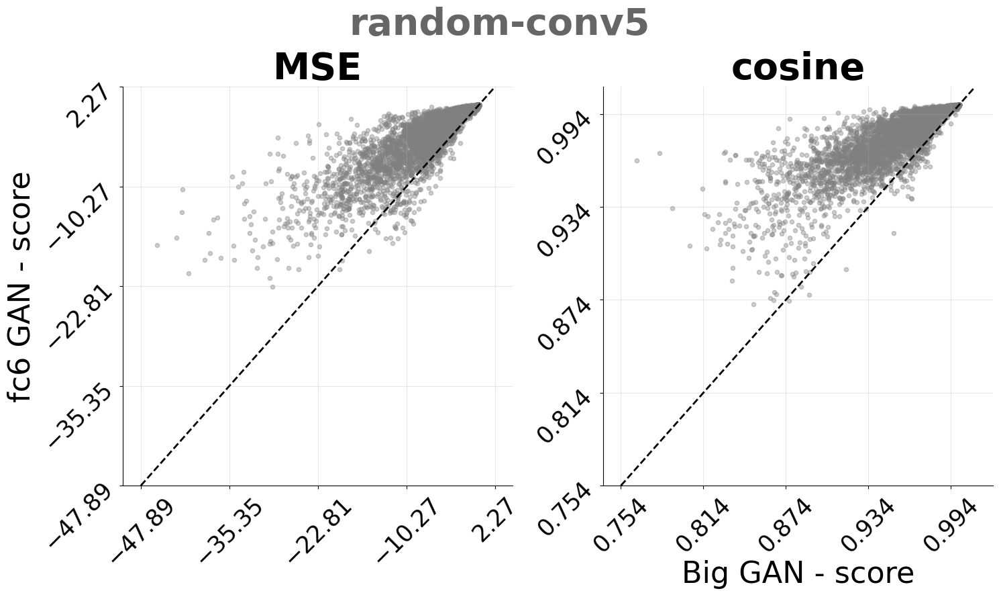

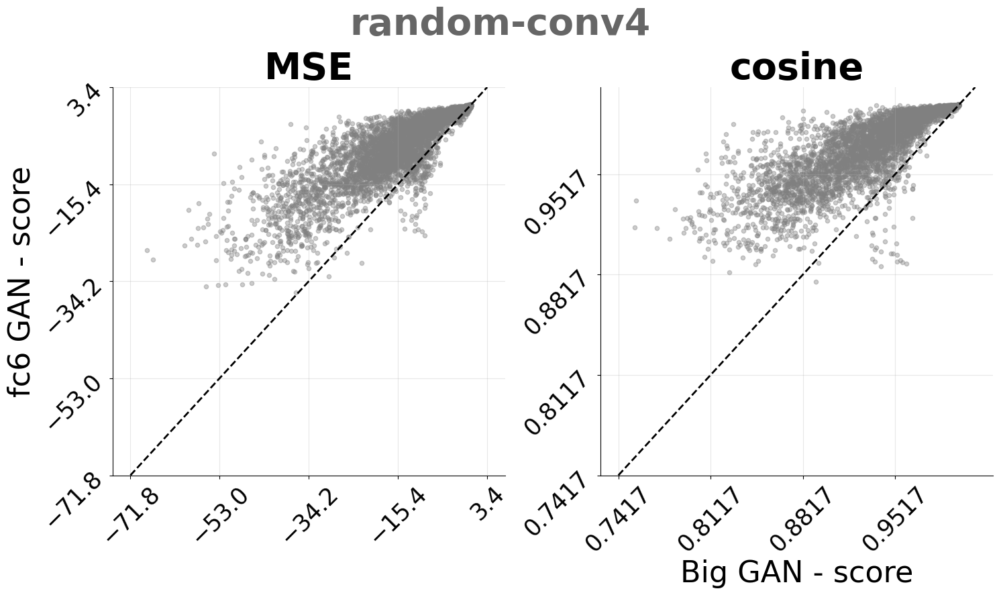

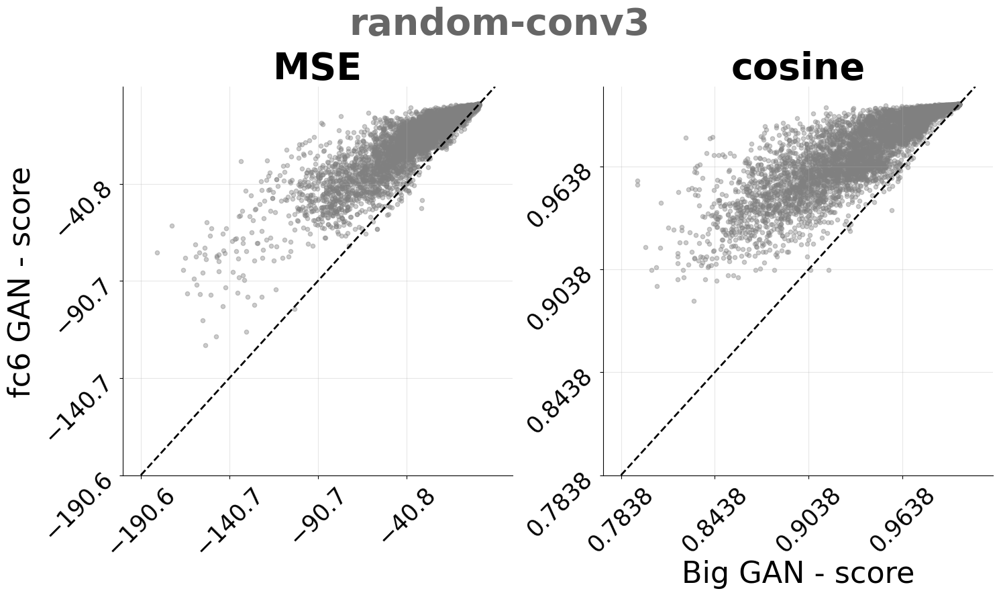

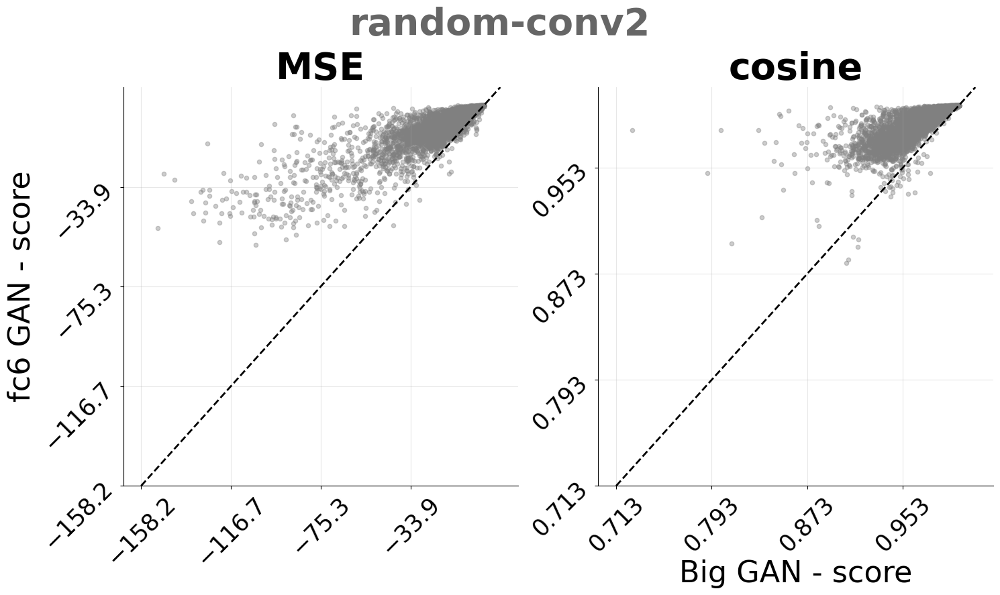

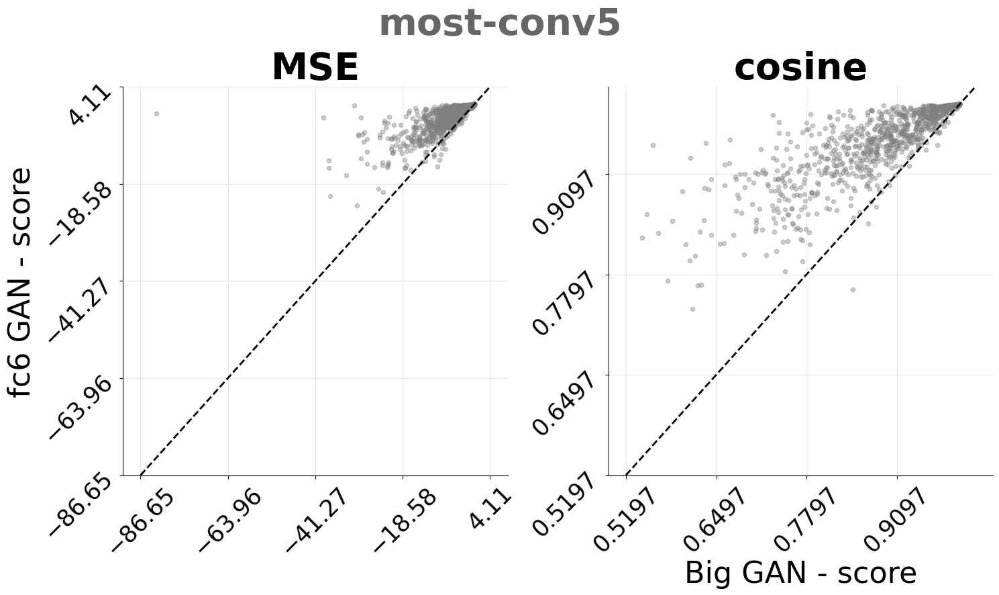

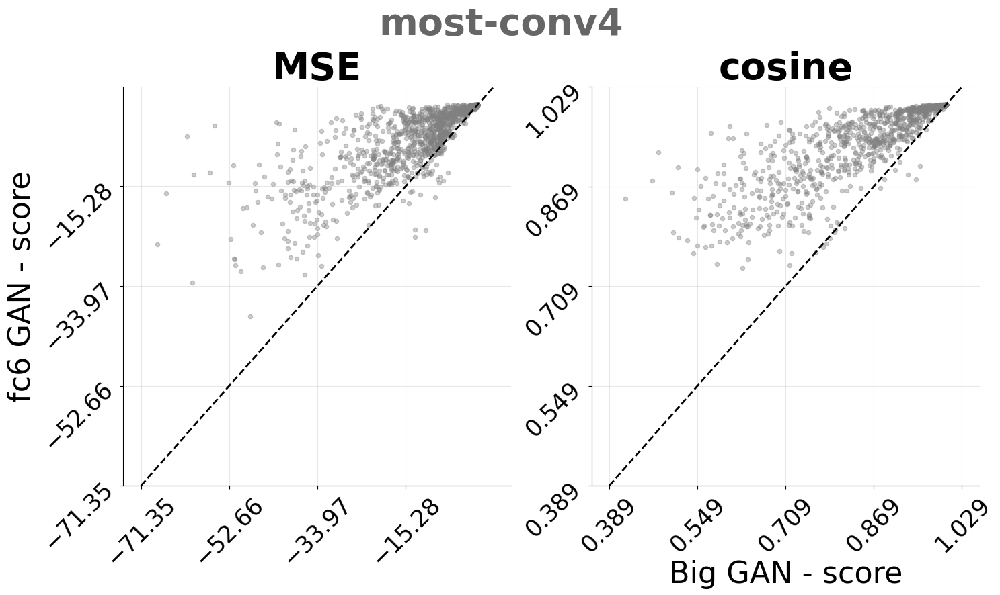

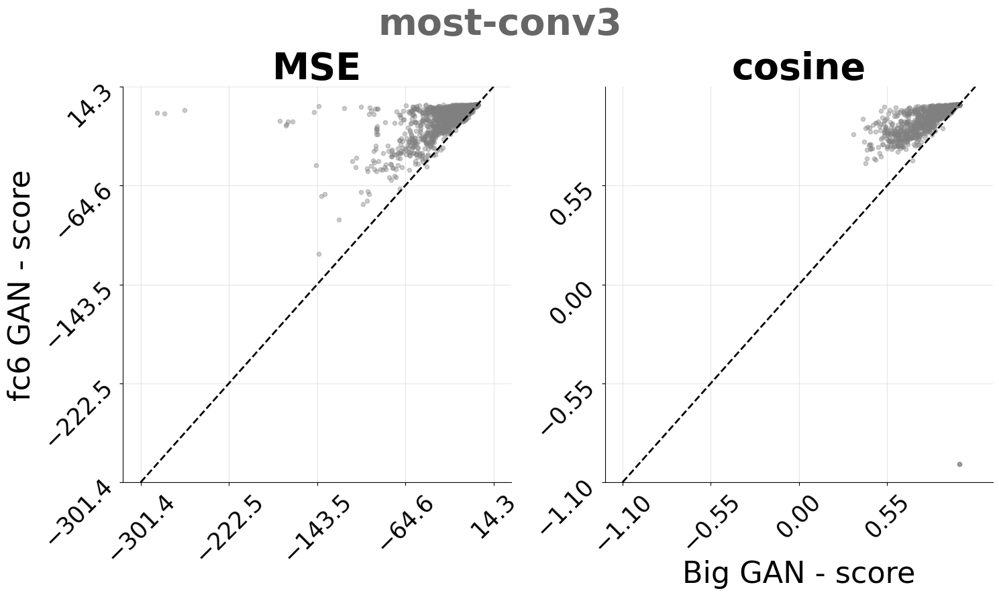

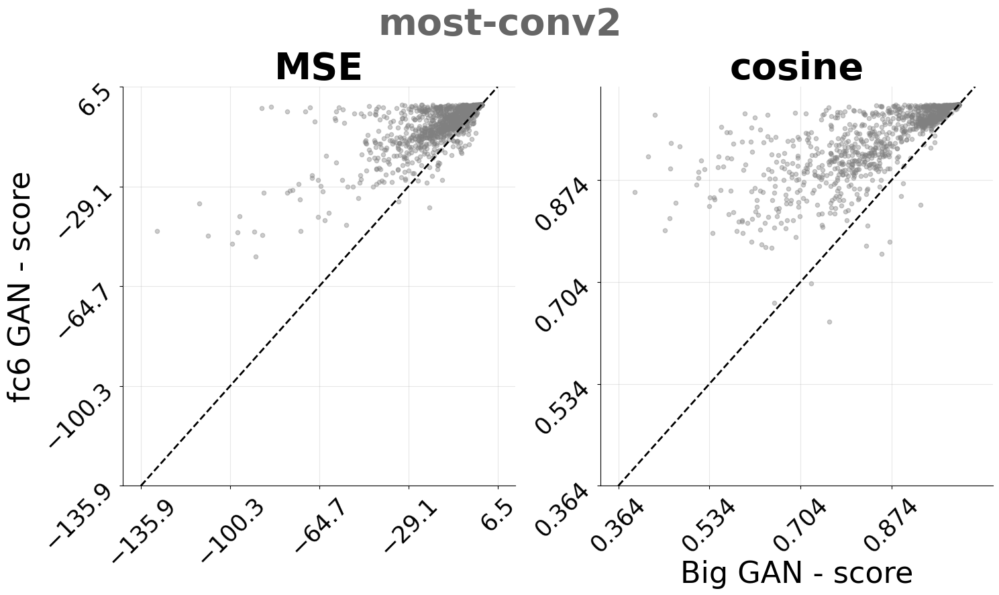

In [256]:
# GAN compratiom. score of Fc6 vs bigGAN - all pop size
metric_name_list = ["MSE", "cosine"]

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25
gan_df_list = [metadata_df_cosine_BG, metadata_df_cosine_fc6]
gan_name_list = ["BigGAN", "FC6"]
gan_name_color_dict = {"BigGAN":'r', "FC6":'g'}
line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")

panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_score")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        fig, ax = plt.subplots(1, 2, figsize=(15, 9))
        for i, metric_name in enumerate(metric_name_list):
            metadata_df_1 = metadata_df_cosine_BG;           
            metadata_df_1_sub =  metadata_df_1[(metadata_df_1["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df_1["similarity_metric"]==metric_name) & (
                                metadata_df_1["layer_short"]==layer_short) & (
                                metadata_df_1["sub_pop_type"] == sub_pop_type)].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "score"]]
            metadata_df_2 = metadata_df_cosine_fc6;     
            metadata_df_2_sub =  metadata_df_2[(metadata_df_2["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df_2["similarity_metric"]==metric_name) & (
                                metadata_df_2["layer_short"]==layer_short) & (
                                metadata_df_2["sub_pop_type"] == sub_pop_type)].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "score"]]

            outer_merged = pd.merge(metadata_df_1_sub, metadata_df_2_sub, on=['output_type', 'trget_imge_name',"pop_size", 'pop_resampling_id', 'gen_rerun_id'], how='outer', indicator=True)
            # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
            ax[i].scatter(outer_merged['score_x'], outer_merged['score_y'], alpha=0.4, s=20, color='gray')
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)
            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')

            # merge the x and y in 1d array
            lims = np.concatenate((ax[i].get_ylim(), ax[i].get_xlim()), axis=0)
            # set x and y axis range lim to be the same as the other rage of both
            ax_lim = [lims.min(), lims.max()]
            
            # plot the diagonal line
            ax[i].plot(ax_lim, ax_lim, color='k', linestyle='--', linewidth=2)
            # set the y and x lim for all the subplots
            ax[i].set_ylim(ax_lim)
            ax[i].set_ylim(ax_lim)
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_yticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
            ax[i].set_xticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
        
    
        ax[1].set_xlabel(f"Big GAN - score", fontsize=axis_font_size)
        ax[0].set_ylabel(f"fc6 GAN - score", fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):           
           
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
            # rotate the x ticks labels
            ax[i].tick_params(axis='x', rotation=45)
            ax[i].tick_params(axis='y', rotation=45)
        # set title for the whole figure
        fig.suptitle(f"{sub_pop_type}-{layer_short}", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        plt.savefig(os.path.join(save_path, f"{sub_pop_type}_all_pop_size_{layer_short}_score_bigGAN_vs_fc6.png"), bbox_inches="tight", pad_inches=0)
        plt.show()

In [ ]:
# GAN compration, delta score vs delta similarity, for each layer

metric_name_list = ["MSE", "cosine"]
coulumn_of_intrest_set = ["score", "l2_distance"] # "l2_distance_normalized" # "sim_index_l2", "sim_index_l1", "l2_distance"

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25

line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")
panle_save_root = os.path.join(save_root, "compare_GANs_bigAndFC6_delta_scoreVsL2")
for sub_pop_type in ["random", "most"]:   
    for j, layer_short in enumerate(layer_short_list):
        fig, ax = plt.subplots(1, 2, figsize=(15, 9))
        for i, metric_name in enumerate(metric_name_list):
            subtract_list = list()
            for coulumn_of_intrest in coulumn_of_intrest_set:
                if sub_pop_type == "random":
                # do the mean and sem by negleting np.nan values
                    result_BG =  metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                        (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                        metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                        metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                        "trget_imge_name", "pop_size", "pop_resampling_id", "gen_rerun_id"])[coulumn_of_intrest].mean().reset_index()
                    
                    result_fc6 =  metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                        (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                        metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                        metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                        "trget_imge_name", "pop_size", "pop_resampling_id", "gen_rerun_id"])[coulumn_of_intrest].mean().reset_index()
                elif sub_pop_type == "most":
                    result_BG = metadata_df_cosine_BG[(metadata_df_cosine_BG["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_BG["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_BG["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_BG["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "gen_rerun_id"])[coulumn_of_intrest].mean().reset_index()

                    result_fc6 = metadata_df_cosine_fc6[(metadata_df_cosine_fc6["output_type"] == "best_gen_imgs_RF_masked") & \
                                                    (metadata_df_cosine_fc6["similarity_metric"]==metric_name) & (
                                                    metadata_df_cosine_fc6["layer_short"]==layer_short) & (
                                                    metadata_df_cosine_fc6["sub_pop_type"] == sub_pop_type)].groupby([
                                                    "trget_imge_name", "pop_size", "gen_rerun_id"])[coulumn_of_intrest].mean().reset_index()

                if metric_name == "cosine":
                    result_BG = result_BG[result_BG["pop_size"] != 1]
                    result_fc6 = result_fc6[result_fc6["pop_size"] != 1]

                subtract_list.append(result_BG[coulumn_of_intrest] - result_fc6[coulumn_of_intrest])
                colors_set = np.zeros((len(result_BG), 3))
                colors_set[:] = .5
                colors_set[result_BG["trget_imge_name"].str.contains("ecoset")] = line_color[0]
                colors_set[result_BG["trget_imge_name"].str.contains("image")] = line_color[1]
            # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
            ax[i].scatter(subtract_list[0], subtract_list[1], alpha=0.3, s=40, color=colors_set)
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)
            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')
            # fit a line to the data using linear regression
            slope, intercept, r_value, p_value, std_err = stats.linregress(subtract_list[0], subtract_list[1])
            # plot the line
            ax[i].plot(subtract_list[0], intercept + slope*subtract_list[0], 'r', label='fitted line')
            # add the r^2 and p value to the plot
            ax[i].text(0.05, 0.95, f"r^2={round(r_value**2, 4)}", transform=ax[i].transAxes, fontsize=axis_font_size, verticalalignment='top')
            ax[i].text(0.05, 0.85, f"p={round(p_value, 4)}", transform=ax[i].transAxes, fontsize=axis_font_size, verticalalignment='top')

            # get the y lims for all the subplots
            y_lims = [ax[i].get_ylim() for i in range(len(ax))]
            # define the y lim that cincludes all the subplots y lims
            y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]

            # get the x lims for all the subplots
            x_lims = [ax[i].get_xlim() for i in range(len(ax))]
            # define the x lim that cincludes all the subplots y lims
            x_lim = [min([x_lims[i][0] for i in range(len(ax))]), max([x_lims[i][1] for i in range(len(ax))])]
        
    
        ax[0].set_ylabel(f"delta L2 distance \n", fontsize=axis_font_size)
        ax[1].set_xlabel(f"\n delta Objective Score", fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):
            
            # set the y and x lim for all the subplots
            ax[i].set_ylim(y_lim)
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_yticks(np.arange(min(y_lim), max(y_lim), round((max(y_lim)-min(y_lim))/4, 2)))
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
            # rotate the x ticks labels
            ax[i].tick_params(axis='x', rotation=45)
        # remove the y ticks labels from the second subplot
        ax[1].set_yticklabels([])
        # set title for the whole figure
        fig.suptitle(f"{sub_pop_type}-{layer_short} \n BigGAN - fc6", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        plt.savefig(os.path.join(save_path, f"{sub_pop_type}_{layer_short}_scoreVSsimilarity_vx_pop_size.png"), bbox_inches="tight", pad_inches=0)
        plt.show()





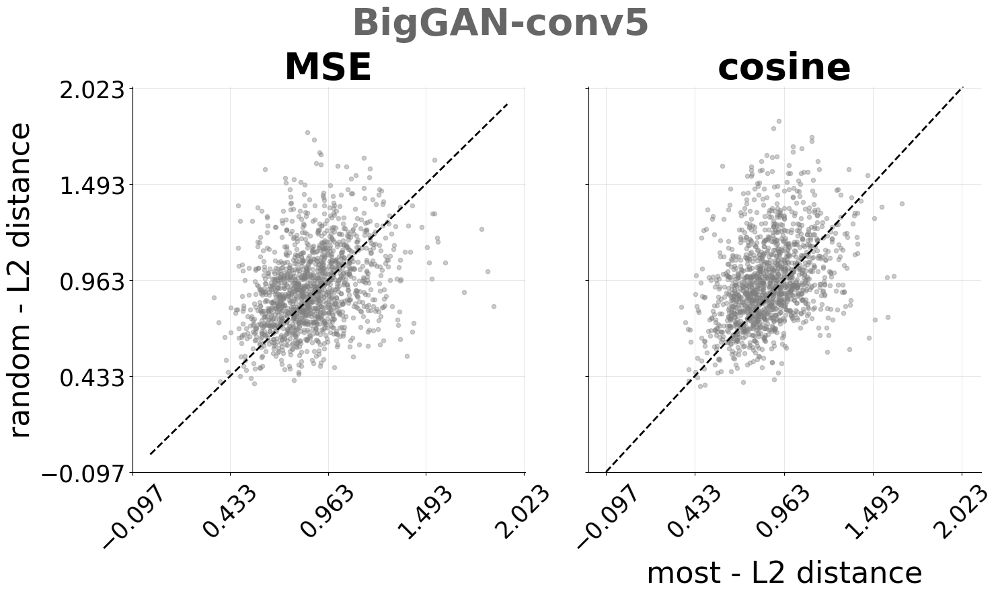

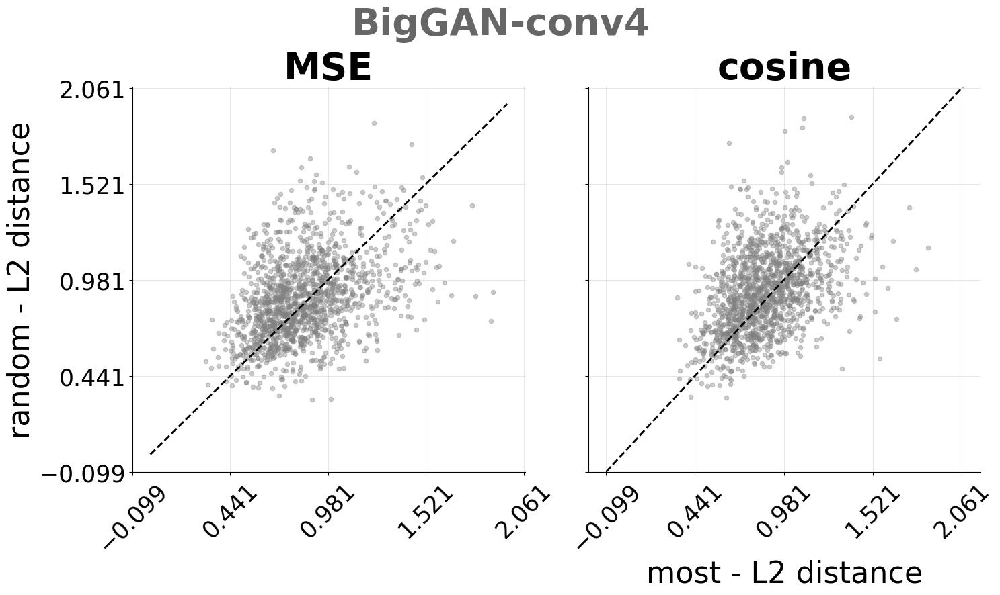

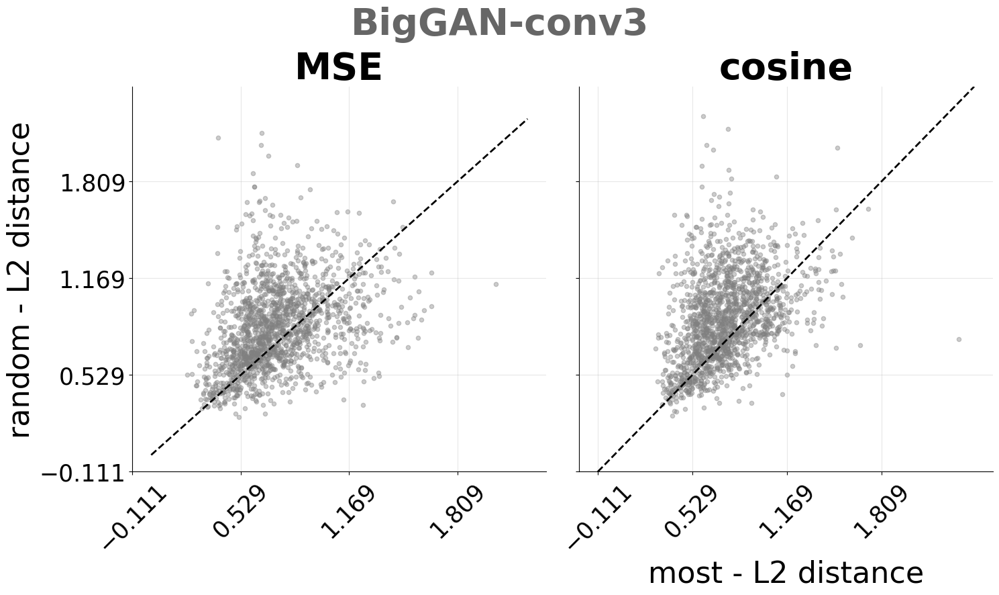

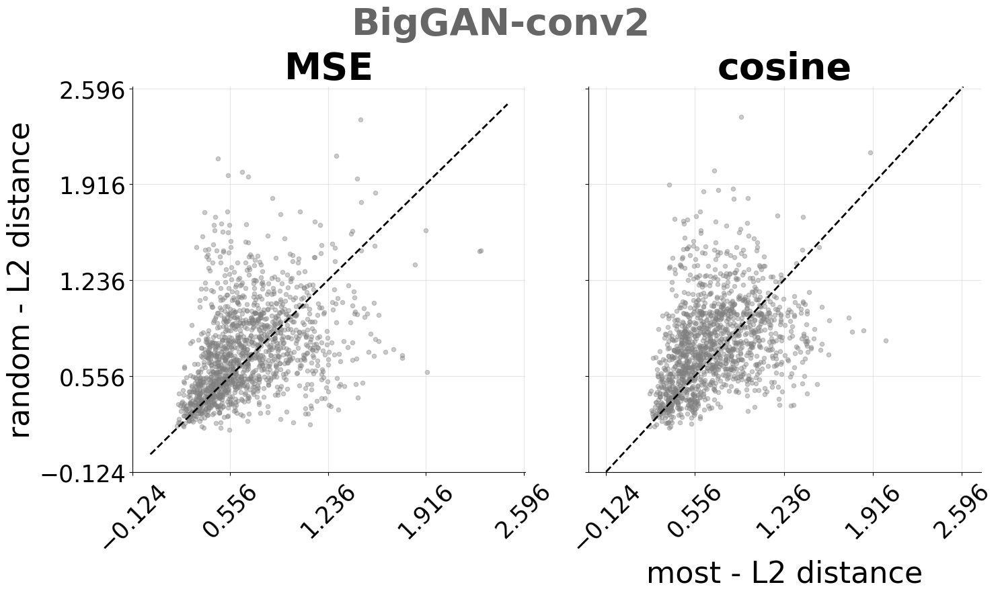

KeyError: "['sim_index_l2'] not in index"

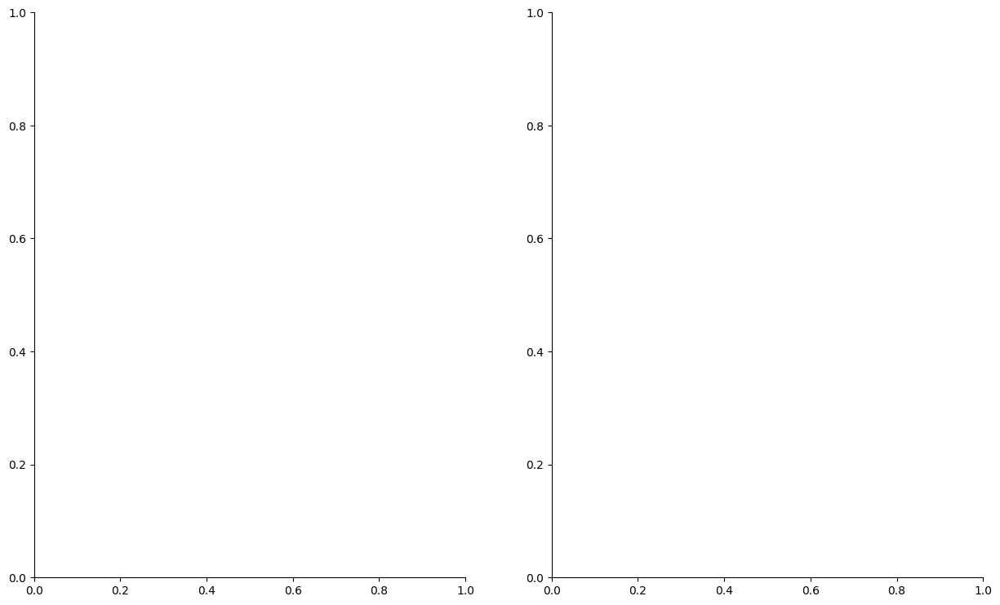

In [336]:
# similarity of most vs random - all pop size
metric_name_list = ["MSE", "cosine"]

layer_short_list = ["conv5", "conv4", "conv3", "conv2"]

# set font size
title_font_size = 40
axis_font_size = 32
tick_font_size = 25
gan_df_list = [metadata_df_cosine_BG, metadata_df_cosine_fc6]
gan_name_list = ["BigGAN", "FC6"]
gan_name_color_dict = {"BigGAN":'r', "FC6":'g'}
line_color = sns.color_palette()
shade_color = sns.color_palette("pastel")

panle_save_dir= os.path.join(save_root, "most_vs_random_all_pop_size_similarity")
for g, metadata_df in enumerate(gan_df_list):
    panle_save_root = os.path.join(panle_save_dir, gan_name_list[g])
    for j, layer_short in enumerate(layer_short_list):
        save_path = os.path.join(panle_save_root, layer_short)
        os.makedirs(save_path, exist_ok=True)
        fig, ax = plt.subplots(1, 2, figsize=(15, 9))
        for i, metric_name in enumerate(metric_name_list):
            metadata_df_1_sub =  metadata_df[(metadata_df["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df["similarity_metric"]==metric_name) & (
                                metadata_df["layer_short"]==layer_short) & (
                                metadata_df["sub_pop_type"] == "most")].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance"]]
            metadata_df_2_sub =  metadata_df[(metadata_df["output_type"] == "best_gen_imgs_RF_masked") & \
                                (metadata_df["similarity_metric"]==metric_name) & (
                                metadata_df["layer_short"]==layer_short) & (
                                metadata_df["sub_pop_type"] == "random")].loc[:,["output_type", "pop_size", "trget_imge_name", "pop_resampling_id", "gen_rerun_id", "l2_distance"]]

            outer_merged = pd.merge(metadata_df_1_sub, metadata_df_2_sub, on=['output_type', 'trget_imge_name',"pop_size", 'pop_resampling_id', 'gen_rerun_id'], how='outer', indicator=True)
            # scatter plot to compare the score and similarity, with small scatter points. color the poit red is the row of the trget_imge_name is contain the "ecoset" otherwise gray
            ax[i].scatter(outer_merged['l2_distance_x'], outer_merged['l2_distance_y'], alpha=0.4, s=20, color='gray')
            ## add grid
            ax[i].grid(True, which='both', axis='both', alpha=0.3)
            ax[i].set_title(f"{metric_name}", fontsize=title_font_size, fontweight='bold')
            

            # get the y lims for all the subplots
            y_lims = [ax[i].get_ylim() for i in range(len(ax))]
            # define the y lim that cincludes all the subplots y lims
            y_lim = [min([y_lims[i][0] for i in range(len(ax))]), max([y_lims[i][1] for i in range(len(ax))])]

            # get the x lims for all the subplots
            x_lims = [ax[i].get_xlim() for i in range(len(ax))]
            # define the x lim that cincludes all the subplots y lims
            x_lim = [min([x_lims[i][0] for i in range(len(ax))]), max([x_lims[i][1] for i in range(len(ax))])]

            # set x and y axis range lim to be the same as the other rage of both
            ax_lim = [min(y_lim[0], x_lim[0]), max(y_lim[1], x_lim[1])]
            
            # plot the diagonal line
            ax[i].plot(ax_lim, ax_lim, color='k', linestyle='--', linewidth=2)
        
    
        ax[1].set_xlabel(f"most - L2 distance", fontsize=axis_font_size)
        ax[0].set_ylabel(f"random - L2 distance", fontsize=axis_font_size)
        # set the y lim for all the subplots
        for i in range(len(ax)):
            
            # set the y and x lim for all the subplots
            ax[i].set_ylim(ax_lim)
            ax[i].set_ylim(ax_lim)
            # make Y-tiks nicer and round them to 1 decimal
            ax[i].set_yticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
            ax[i].set_xticks(np.arange(min(ax_lim), max(ax_lim), round((max(ax_lim)-min(ax_lim))/4, 2)))
            # increase the font size of the y  and x ticks
            ax[i].tick_params(axis='y', which='major', labelsize=tick_font_size)
            ax[i].tick_params(axis='x', which='major', labelsize=tick_font_size)
            # rotate the x ticks labels
            ax[i].tick_params(axis='x', rotation=45)
        # remove the y ticks labels from the second subplot
        ax[1].set_yticklabels([])
        # set title for the whole figure
        fig.suptitle(f"{gan_name_list[g]}-{layer_short}", fontsize=title_font_size, color=.4*np.ones(3), fontweight='bold')
        # set tight layout
        fig.tight_layout()
        plt.savefig(os.path.join(save_path, f"all_pop_size_{layer_short}_similarity_most_vs_random.png"), bbox_inches="tight", pad_inches=0)
        plt.show()